## Prerequisites


In [1]:
import dotenv

dotenv.load_dotenv()

True

In [2]:
project_name = "language_fr"
encoder_id = "mert_v1_95m"


# data preparation
target_column = "language"
target_positive_class = "fr"


## 1. Train Multiple CAVs for Significance Test


In [3]:
# training meta parameters
num_train_runs = 100
training_sample_count = 200


# training parameters
epochs = 500
batch_size = training_sample_count
learning_rate = 0.002
embedding_dim = 768
dropout_rate = 0.0

### Prepare Data


In [4]:
import os

import pandas as pd
import s3fs
from cavmir.training.dataset import (
    create_dataloader_from_webdataset_path,
    create_webdataset,
)
from cavmir.utils import (
    append_embeddings_to_df,
    create_training_samples_from_df,
    train_one_cav,
    store_cav_vector_array,
    store_evaluation_metrics,
)

s3 = s3fs.S3FileSystem(anon=False)

dataset_prefix = os.environ["DATASET_PREFIX"]
embedding_prefix = os.environ["EMBEDDING_PREFIX"]


In [5]:
# load training set
df = pd.read_csv(os.path.join(dataset_prefix, f"train_dataset_{project_name}.csv"))
df = append_embeddings_to_df(df, embedding_prefix, encoder_id, s3)

In [6]:
# create test set for evaluation
df_test = pd.read_csv(os.path.join(dataset_prefix, f"test_dataset_{project_name}.csv"))
df_test = append_embeddings_to_df(df_test, embedding_prefix, encoder_id, s3)

create_webdataset(
    create_training_samples_from_df(df_test),
    f"datasets/{encoder_id}_test_{project_name}.tar",
)

test_dataloader = create_dataloader_from_webdataset_path(
    f"datasets/{encoder_id}_test_{project_name}.tar", batch_size=batch_size
)

### Training


Training run 1/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6929
Epoch 1 Validation Loss: 0.6939
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6527
Epoch 11 Validation Loss: 0.6795
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6189
Epoch 21 Validation Loss: 0.6699
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5897
Epoch 31 Validation Loss: 0.6633
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5638
Epoch 41 Validation Loss: 0.6590
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5405
Epoch 51 Validation Loss: 0.6564
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5195
Epoch 61 Validation Loss: 0.6549
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5004
Epoch 71 Validation Loss: 0.6541
Model saved to train

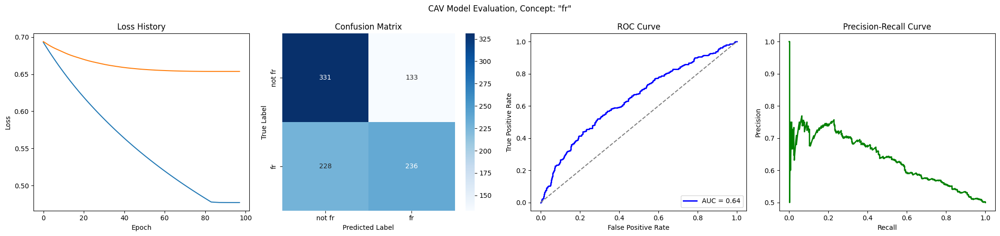

Training run 2/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6871
Epoch 1 Validation Loss: 0.6923
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6466
Epoch 11 Validation Loss: 0.6809
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6128
Epoch 21 Validation Loss: 0.6740
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5839
Epoch 31 Validation Loss: 0.6696
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5587
Epoch 41 Validation Loss: 0.6662
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5364
Epoch 51 Validation Loss: 0.6638
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5163
Epoch 61 Validation Loss: 0.6622
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4979
Epoch 71 Validation Loss: 0.6613
Model saved to train

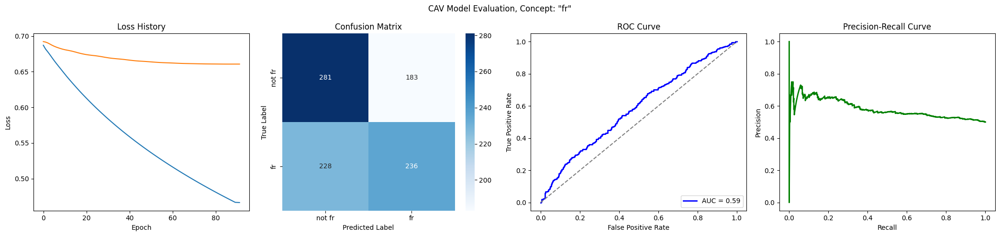

Training run 3/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6965
Epoch 1 Validation Loss: 0.6896
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6517
Epoch 11 Validation Loss: 0.6682
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6138
Epoch 21 Validation Loss: 0.6509
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5821
Epoch 31 Validation Loss: 0.6389
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5549
Epoch 41 Validation Loss: 0.6306
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5312
Epoch 51 Validation Loss: 0.6245
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5100
Epoch 61 Validation Loss: 0.6198
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4909
Epoch 71 Validation Loss: 0.6164
Model saved to train

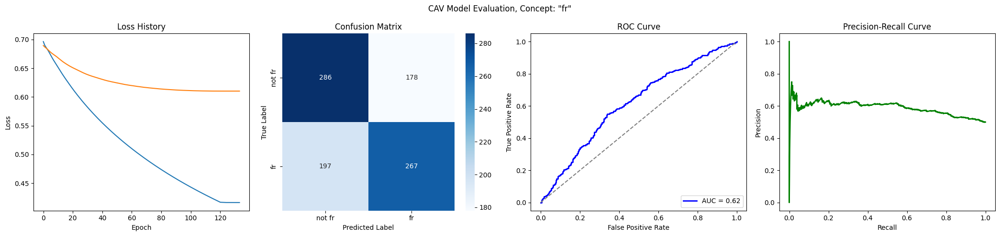

Training run 4/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6957
Epoch 1 Validation Loss: 0.6881
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6645
Epoch 11 Validation Loss: 0.6734
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6371
Epoch 21 Validation Loss: 0.6610
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6128
Epoch 31 Validation Loss: 0.6512
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5910
Epoch 41 Validation Loss: 0.6433
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5712
Epoch 51 Validation Loss: 0.6365
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5531
Epoch 61 Validation Loss: 0.6303
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5363
Epoch 71 Validation Loss: 0.6246
Model saved to train

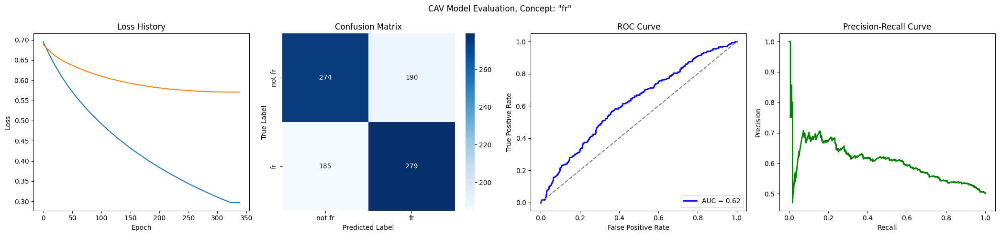

Training run 5/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6872
Epoch 1 Validation Loss: 0.6890
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6364
Epoch 11 Validation Loss: 0.6731
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5968
Epoch 21 Validation Loss: 0.6661
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5652
Epoch 31 Validation Loss: 0.6645
Model saved to trainings/language_fr/state_dict.pth
Early stopping at epoch 36
Loss history saved to trainings/language_fr/loss_history.json


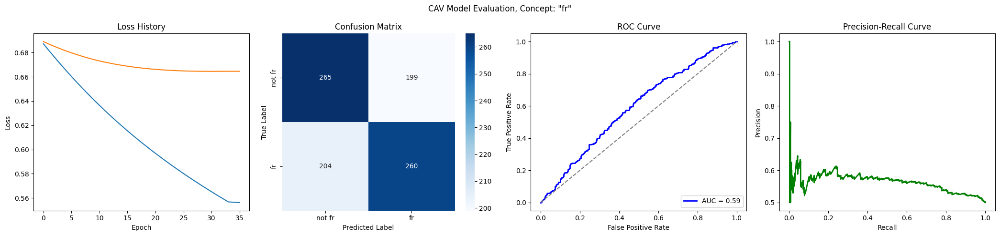

Training run 6/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7022
Epoch 1 Validation Loss: 0.6927
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6589
Epoch 11 Validation Loss: 0.6695
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6262
Epoch 21 Validation Loss: 0.6514
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5981
Epoch 31 Validation Loss: 0.6373
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5738
Epoch 41 Validation Loss: 0.6262
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5522
Epoch 51 Validation Loss: 0.6170
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5325
Epoch 61 Validation Loss: 0.6092
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5144
Epoch 71 Validation Loss: 0.6026
Model saved to train

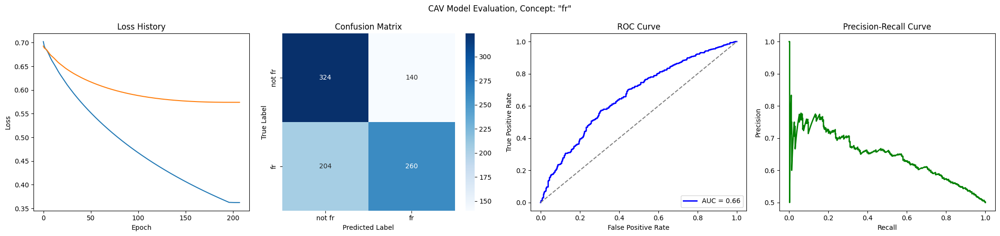

Training run 7/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6984
Epoch 1 Validation Loss: 0.6939
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6557
Epoch 11 Validation Loss: 0.6696
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6196
Epoch 21 Validation Loss: 0.6522
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5886
Epoch 31 Validation Loss: 0.6405
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5614
Epoch 41 Validation Loss: 0.6325
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5372
Epoch 51 Validation Loss: 0.6269
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5154
Epoch 61 Validation Loss: 0.6226
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4956
Epoch 71 Validation Loss: 0.6192
Model saved to train

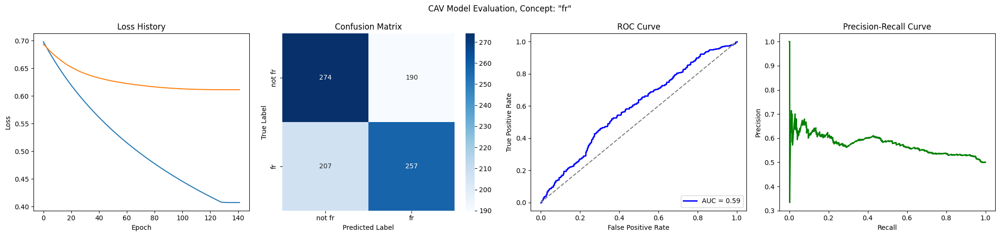

Training run 8/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6937
Epoch 1 Validation Loss: 0.6924
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6517
Epoch 11 Validation Loss: 0.6694
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6156
Epoch 21 Validation Loss: 0.6533
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5837
Epoch 31 Validation Loss: 0.6417
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5554
Epoch 41 Validation Loss: 0.6327
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5301
Epoch 51 Validation Loss: 0.6252
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5073
Epoch 61 Validation Loss: 0.6189
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4865
Epoch 71 Validation Loss: 0.6139
Model saved to train

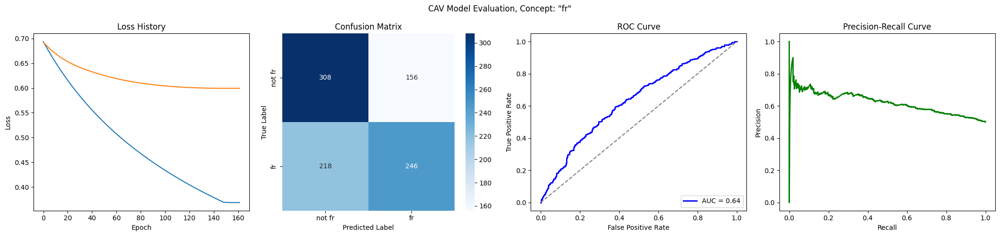

Training run 9/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6933
Epoch 1 Validation Loss: 0.6977
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6466
Epoch 11 Validation Loss: 0.6884
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6092
Epoch 21 Validation Loss: 0.6840
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5786
Epoch 31 Validation Loss: 0.6813
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5525
Epoch 41 Validation Loss: 0.6797
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5297
Epoch 51 Validation Loss: 0.6789
Model saved to trainings/language_fr/state_dict.pth
Early stopping at epoch 59
Loss history saved to trainings/language_fr/loss_history.json


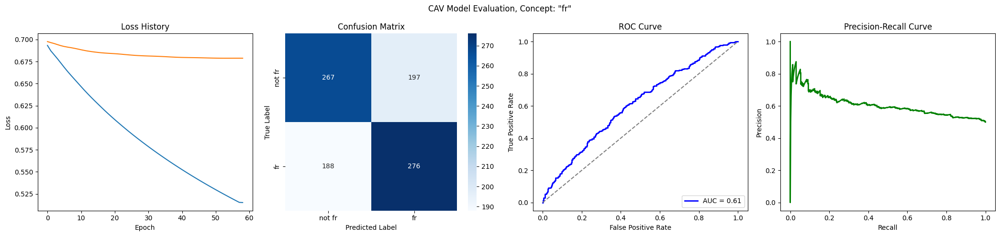

Training run 10/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6942
Epoch 1 Validation Loss: 0.6917
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6565
Epoch 11 Validation Loss: 0.6777
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6237
Epoch 21 Validation Loss: 0.6678
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5948
Epoch 31 Validation Loss: 0.6608
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5692
Epoch 41 Validation Loss: 0.6557
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5461
Epoch 51 Validation Loss: 0.6519
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5251
Epoch 61 Validation Loss: 0.6491
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5058
Epoch 71 Validation Loss: 0.6472
Model saved to trai

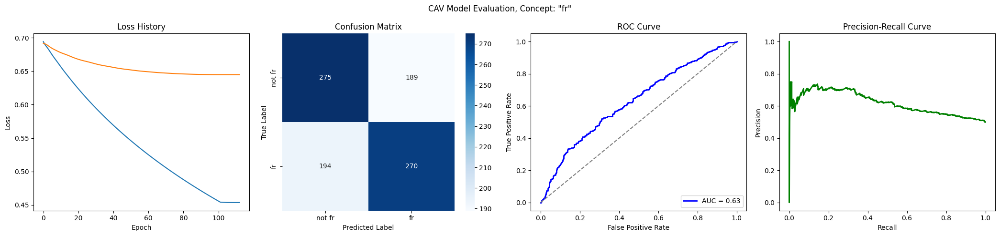

Training run 11/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6998
Epoch 1 Validation Loss: 0.6925
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6683
Epoch 11 Validation Loss: 0.6734
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6420
Epoch 21 Validation Loss: 0.6582
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6186
Epoch 31 Validation Loss: 0.6475
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5970
Epoch 41 Validation Loss: 0.6396
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5771
Epoch 51 Validation Loss: 0.6342
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5587
Epoch 61 Validation Loss: 0.6303
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5415
Epoch 71 Validation Loss: 0.6274
Model saved to trai

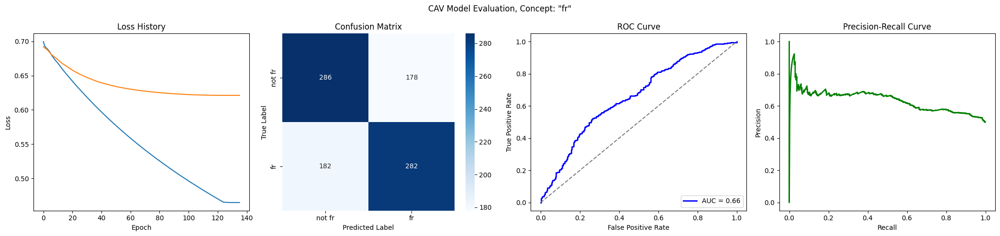

Training run 12/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6967
Epoch 1 Validation Loss: 0.6928
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6501
Epoch 11 Validation Loss: 0.6816
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6124
Epoch 21 Validation Loss: 0.6740
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5815
Epoch 31 Validation Loss: 0.6690
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5555
Epoch 41 Validation Loss: 0.6646
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5330
Epoch 51 Validation Loss: 0.6605
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5132
Epoch 61 Validation Loss: 0.6564
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4954
Epoch 71 Validation Loss: 0.6525
Model saved to trai

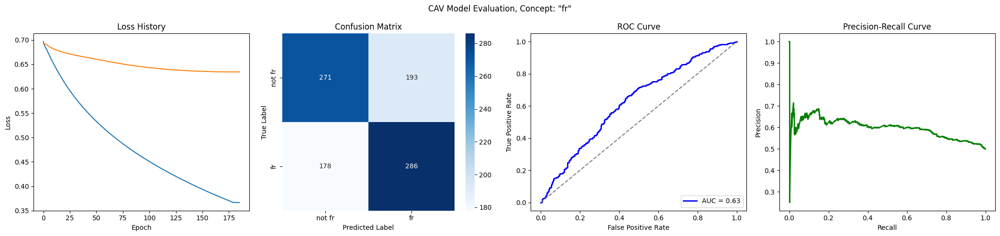

Training run 13/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6971
Epoch 1 Validation Loss: 0.6949
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6607
Epoch 11 Validation Loss: 0.6829
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6287
Epoch 21 Validation Loss: 0.6737
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6007
Epoch 31 Validation Loss: 0.6677
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5757
Epoch 41 Validation Loss: 0.6643
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5532
Epoch 51 Validation Loss: 0.6626
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5328
Epoch 61 Validation Loss: 0.6620
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5190
Epoch 71 Validation Loss: 0.6618
Early stopping at e

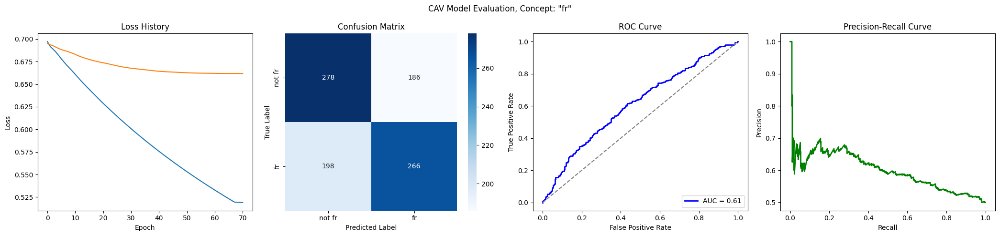

Training run 14/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6957
Epoch 1 Validation Loss: 0.6940
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6567
Epoch 11 Validation Loss: 0.6808
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6225
Epoch 21 Validation Loss: 0.6711
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5927
Epoch 31 Validation Loss: 0.6642
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5666
Epoch 41 Validation Loss: 0.6594
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5432
Epoch 51 Validation Loss: 0.6561
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5222
Epoch 61 Validation Loss: 0.6538
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5031
Epoch 71 Validation Loss: 0.6519
Model saved to trai

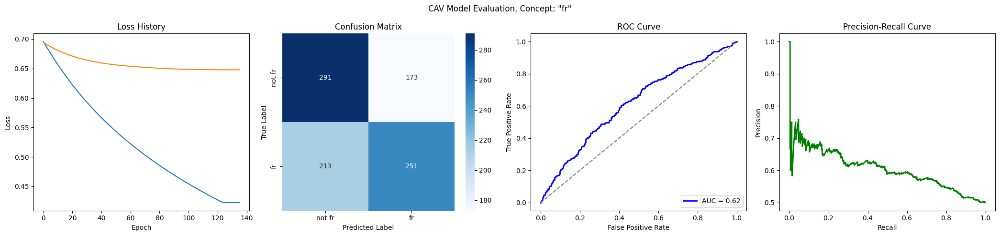

Training run 15/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6931
Epoch 1 Validation Loss: 0.6914
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6548
Epoch 11 Validation Loss: 0.6772
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6218
Epoch 21 Validation Loss: 0.6677
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5933
Epoch 31 Validation Loss: 0.6617
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5684
Epoch 41 Validation Loss: 0.6578
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5462
Epoch 51 Validation Loss: 0.6552
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5263
Epoch 61 Validation Loss: 0.6533
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5081
Epoch 71 Validation Loss: 0.6521
Model saved to trai

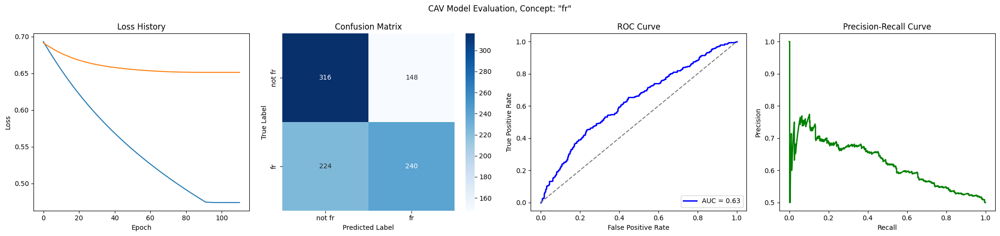

Training run 16/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6937
Epoch 1 Validation Loss: 0.6964
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6523
Epoch 11 Validation Loss: 0.6735
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6177
Epoch 21 Validation Loss: 0.6590
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5881
Epoch 31 Validation Loss: 0.6517
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5621
Epoch 41 Validation Loss: 0.6493
Model saved to trainings/language_fr/state_dict.pth
Early stopping at epoch 49
Loss history saved to trainings/language_fr/loss_history.json


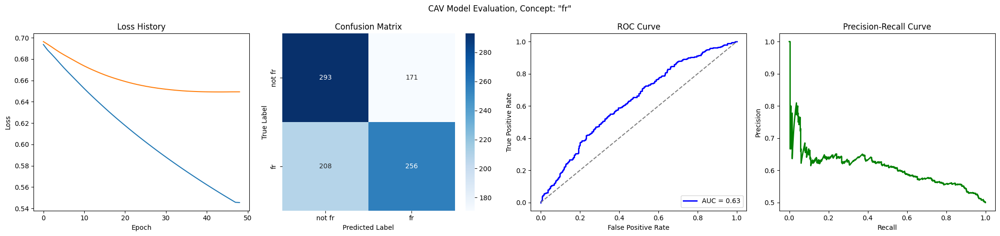

Training run 17/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6989
Epoch 1 Validation Loss: 0.6942
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6533
Epoch 11 Validation Loss: 0.6788
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6184
Epoch 21 Validation Loss: 0.6689
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5897
Epoch 31 Validation Loss: 0.6609
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5654
Epoch 41 Validation Loss: 0.6549
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5437
Epoch 51 Validation Loss: 0.6499
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5239
Epoch 61 Validation Loss: 0.6450
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5057
Epoch 71 Validation Loss: 0.6410
Model saved to trai

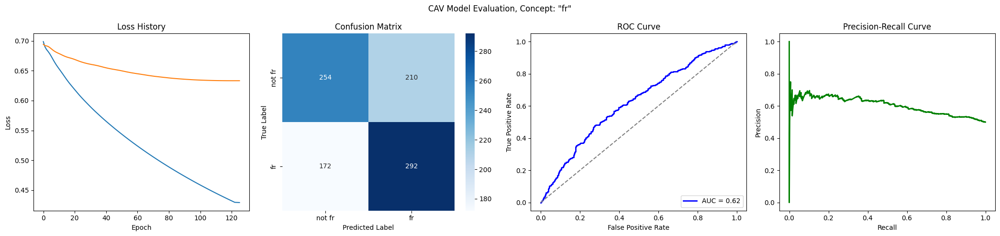

Training run 18/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6938
Epoch 1 Validation Loss: 0.6858
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6495
Epoch 11 Validation Loss: 0.6732
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6143
Epoch 21 Validation Loss: 0.6666
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5847
Epoch 31 Validation Loss: 0.6631
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5588
Epoch 41 Validation Loss: 0.6612
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5357
Epoch 51 Validation Loss: 0.6601
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5149
Epoch 61 Validation Loss: 0.6595
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4992
Epoch 71 Validation Loss: 0.6593
Model saved to trai

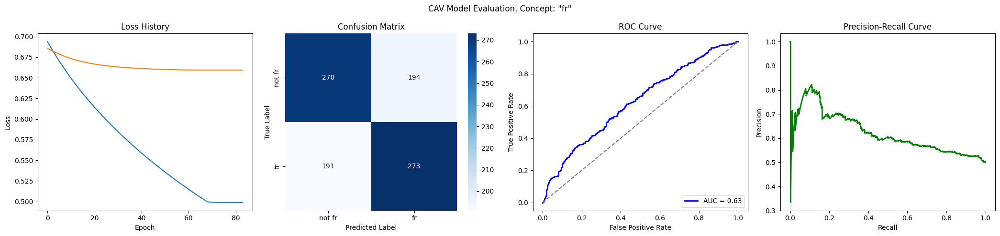

Training run 19/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6949
Epoch 1 Validation Loss: 0.6932
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6486
Epoch 11 Validation Loss: 0.6760
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6104
Epoch 21 Validation Loss: 0.6648
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5788
Epoch 31 Validation Loss: 0.6578
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5519
Epoch 41 Validation Loss: 0.6528
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5285
Epoch 51 Validation Loss: 0.6487
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5076
Epoch 61 Validation Loss: 0.6452
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4887
Epoch 71 Validation Loss: 0.6420
Model saved to trai

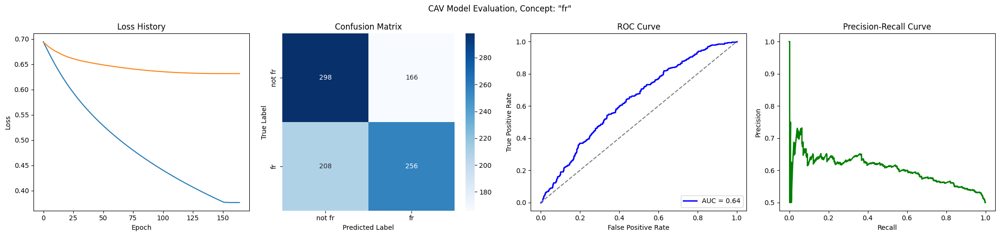

Training run 20/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6934
Epoch 1 Validation Loss: 0.6915
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6563
Epoch 11 Validation Loss: 0.6801
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6236
Epoch 21 Validation Loss: 0.6711
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5948
Epoch 31 Validation Loss: 0.6641
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5693
Epoch 41 Validation Loss: 0.6588
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5465
Epoch 51 Validation Loss: 0.6550
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5258
Epoch 61 Validation Loss: 0.6523
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5070
Epoch 71 Validation Loss: 0.6505
Model saved to trai

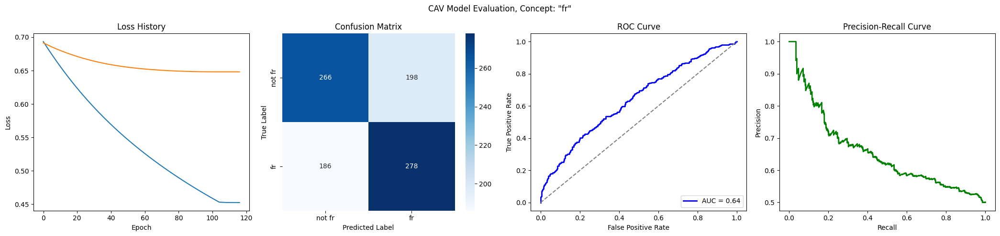

Training run 21/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6971
Epoch 1 Validation Loss: 0.6966
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6668
Epoch 11 Validation Loss: 0.6861
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6393
Epoch 21 Validation Loss: 0.6771
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6143
Epoch 31 Validation Loss: 0.6699
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5913
Epoch 41 Validation Loss: 0.6645
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5703
Epoch 51 Validation Loss: 0.6604
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5510
Epoch 61 Validation Loss: 0.6574
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5332
Epoch 71 Validation Loss: 0.6553
Model saved to trai

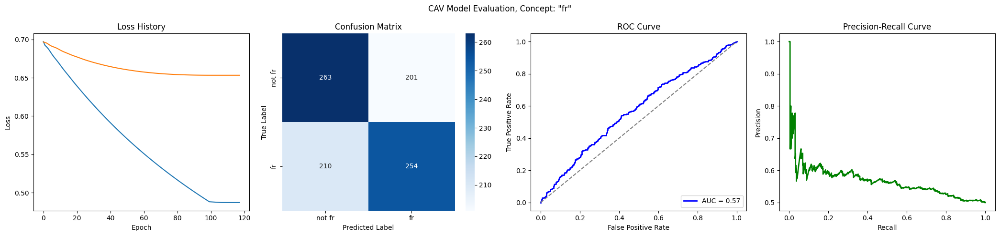

Training run 22/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6970
Epoch 1 Validation Loss: 0.6923
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6549
Epoch 11 Validation Loss: 0.6796
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6215
Epoch 21 Validation Loss: 0.6710
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5930
Epoch 31 Validation Loss: 0.6653
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5683
Epoch 31/500
Epoch 31 Train Loss: 0.5935
Epoch 31 Validation Loss: 0.6572
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5680
Epoch 41 Validation Loss: 0.6536
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5453
Epoch 51 Validation Loss: 0.6521
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5301
Epoch 61 Va

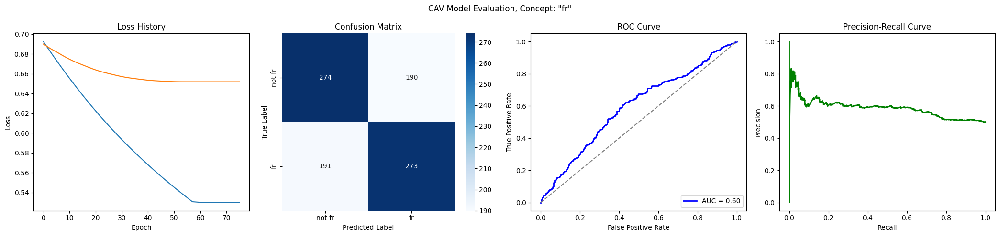

Training run 26/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6968
Epoch 1 Validation Loss: 0.6924
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6635
Epoch 11 Validation Loss: 0.6838
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6350
Epoch 21 Validation Loss: 0.6775
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6098
Epoch 31 Validation Loss: 0.6734
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5868
Epoch 41 Validation Loss: 0.6704
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5658
Epoch 51 Validation Loss: 0.6686
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5466
Epoch 61 Validation Loss: 0.6679
Model saved to trainings/language_fr/state_dict.pth
Early stopping at epoch 69
Loss history saved to trainings/language_fr/loss_history.json


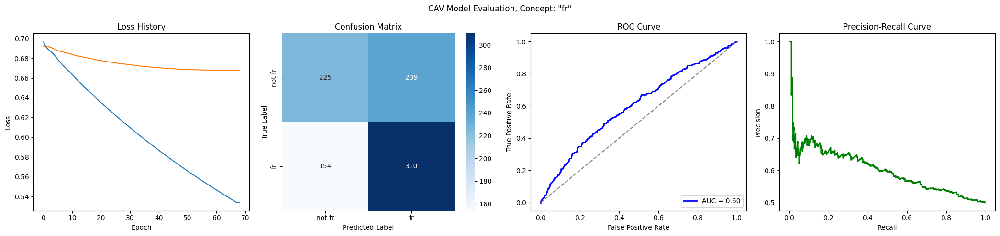

Training run 27/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6942
Epoch 1 Validation Loss: 0.6924
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6555
Epoch 11 Validation Loss: 0.6858
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6219
Epoch 21 Validation Loss: 0.6817
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5928
Epoch 31 Validation Loss: 0.6793
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5674
Epoch 41 Validation Loss: 0.6774
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5447
Epoch 51 Validation Loss: 0.6757
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5243
Epoch 61 Validation Loss: 0.6742
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5058
Epoch 71 Validation Loss: 0.6730
Model saved to trai

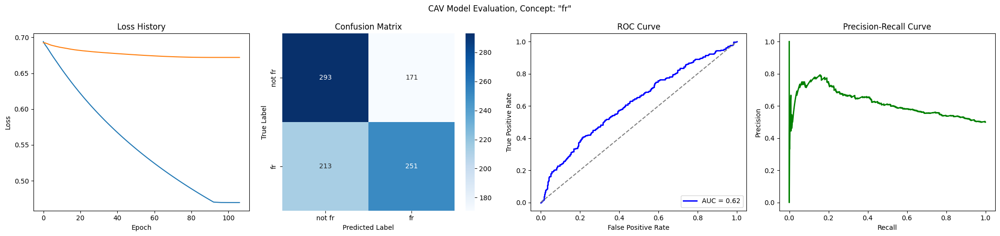

Training run 28/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7016
Epoch 1 Validation Loss: 0.6942
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6577
Epoch 11 Validation Loss: 0.6844
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6237
Epoch 21 Validation Loss: 0.6777
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5945
Epoch 31 Validation Loss: 0.6727
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5690
Epoch 41 Validation Loss: 0.6681
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5462
Epoch 51 Validation Loss: 0.6634
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5254
Epoch 61 Validation Loss: 0.6594
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5064
Epoch 71 Validation Loss: 0.6559
Model saved to trai

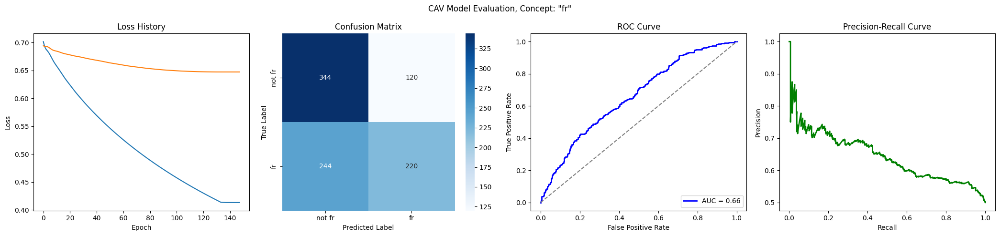

Training run 29/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6924
Epoch 1 Validation Loss: 0.6897
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6480
Epoch 11 Validation Loss: 0.6759
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6107
Epoch 21 Validation Loss: 0.6676
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5791
Epoch 31 Validation Loss: 0.6634
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5517
Epoch 41 Validation Loss: 0.6618
Model saved to trainings/language_fr/state_dict.pth
Early stopping at epoch 49
Loss history saved to trainings/language_fr/loss_history.json


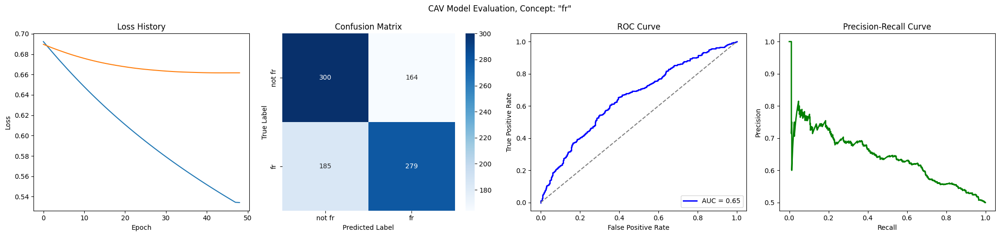

Training run 30/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6926
Epoch 1 Validation Loss: 0.6887
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6488
Epoch 11 Validation Loss: 0.6700
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6129
Epoch 21 Validation Loss: 0.6578
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5823
Epoch 31 Validation Loss: 0.6497
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5559
Epoch 41 Validation Loss: 0.6435
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5324
Epoch 51 Validation Loss: 0.6382
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5114
Epoch 61 Validation Loss: 0.6335
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4922
Epoch 71 Validation Loss: 0.6294
Model saved to trai

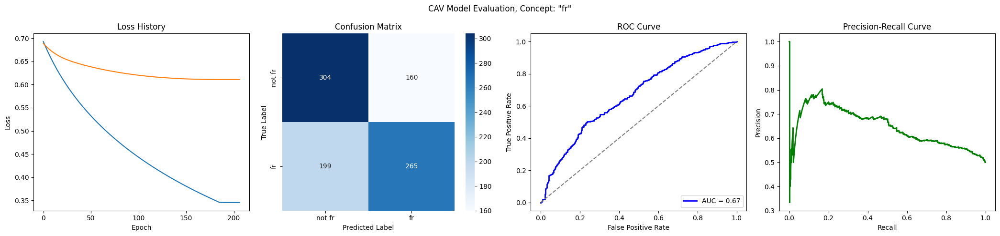

Training run 31/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6965
Epoch 1 Validation Loss: 0.6939
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6490
Epoch 11 Validation Loss: 0.6795
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6112
Epoch 21 Validation Loss: 0.6711
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5800
Epoch 31 Validation Loss: 0.6664
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5534
Epoch 41 Validation Loss: 0.6640
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5302
Epoch 51 Validation Loss: 0.6629
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5131
Epoch 61 Validation Loss: 0.6628
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5127
Epoch 71 Validation Loss: 0.6628
Early stopping at e

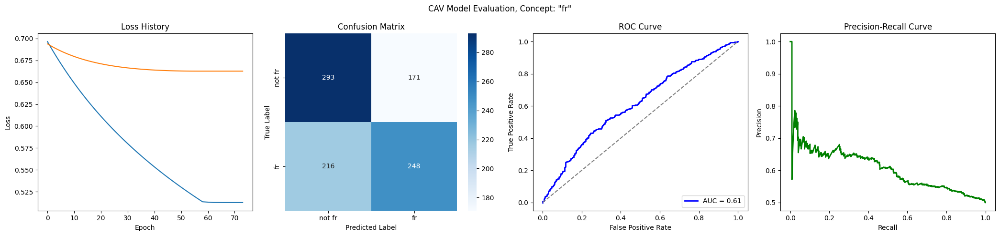

Training run 32/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6963
Epoch 1 Validation Loss: 0.6937
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6466
Epoch 11 Validation Loss: 0.6684
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6072
Epoch 21 Validation Loss: 0.6524
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5756
Epoch 31 Validation Loss: 0.6431
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5492
Epoch 41 Validation Loss: 0.6383
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5262
Epoch 51 Validation Loss: 0.6360
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5058
Epoch 61 Validation Loss: 0.6352
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4975
Epoch 71 Validation Loss: 0.6352
Model saved to trai

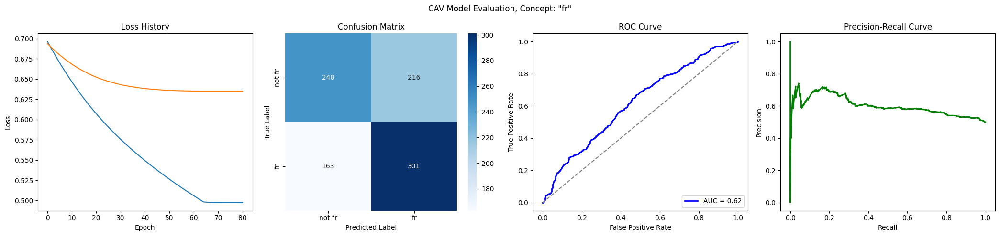

Training run 33/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7002
Epoch 1 Validation Loss: 0.6948
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6590
Epoch 11 Validation Loss: 0.6764
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6264
Epoch 21 Validation Loss: 0.6620
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5988
Epoch 31 Validation Loss: 0.6517
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5750
Epoch 41 Validation Loss: 0.6439
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5539
Epoch 51 Validation Loss: 0.6376
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5347
Epoch 61 Validation Loss: 0.6323
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5170
Epoch 71 Validation Loss: 0.6278
Model saved to trai

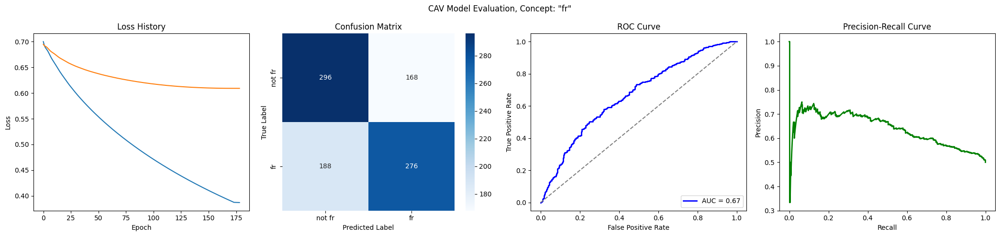

Training run 34/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6929
Epoch 1 Validation Loss: 0.6934
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6475
Epoch 11 Validation Loss: 0.6798
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6113
Epoch 21 Validation Loss: 0.6734
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5822
Epoch 31 Validation Loss: 0.6710
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5577
Epoch 41 Validation Loss: 0.6699
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5363
Epoch 51 Validation Loss: 0.6689
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5170
Epoch 61 Validation Loss: 0.6680
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4994
Epoch 71 Validation Loss: 0.6674
Model saved to trai

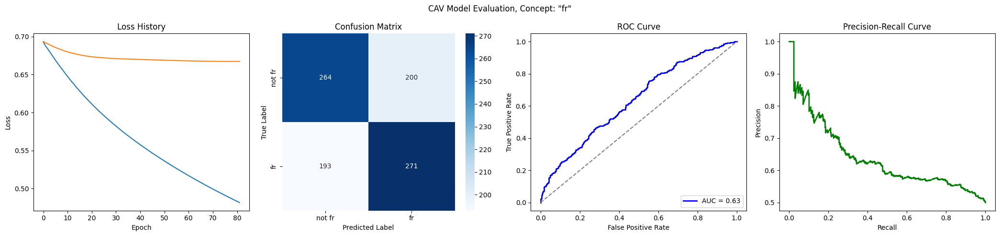

Training run 35/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6919
Epoch 1 Validation Loss: 0.6895
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6504
Epoch 11 Validation Loss: 0.6708
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6155
Epoch 21 Validation Loss: 0.6585
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5858
Epoch 31 Validation Loss: 0.6507
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5602
Epoch 41 Validation Loss: 0.6458
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5377
Epoch 51 Validation Loss: 0.6431
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5176
Epoch 61 Validation Loss: 0.6416
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4994
Epoch 71 Validation Loss: 0.6409
Model saved to trai

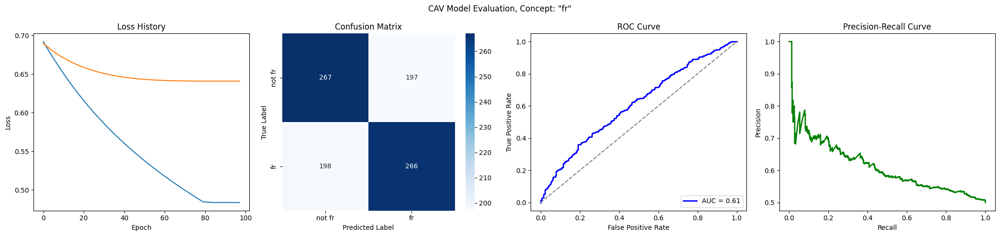

Training run 36/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6968
Epoch 1 Validation Loss: 0.6921
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6547
Epoch 11 Validation Loss: 0.6756
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6197
Epoch 21 Validation Loss: 0.6641
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5902
Epoch 31 Validation Loss: 0.6558
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5641
Epoch 41 Validation Loss: 0.6497
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5405
Epoch 51 Validation Loss: 0.6451
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5192
Epoch 61 Validation Loss: 0.6415
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4996
Epoch 71 Validation Loss: 0.6385
Model saved to trai

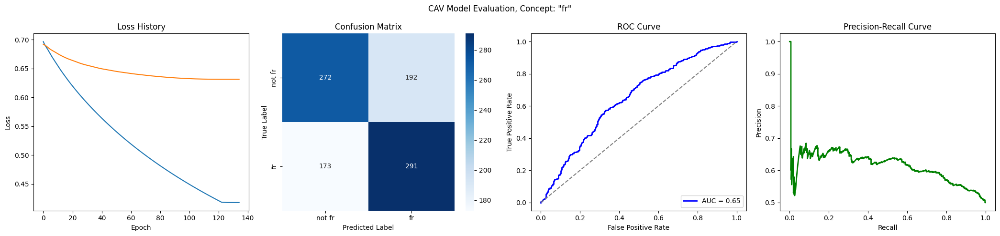

Training run 37/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6931
Epoch 1 Validation Loss: 0.6913
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6535
Epoch 11 Validation Loss: 0.6862
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6191
Epoch 21 Validation Loss: 0.6846
Model saved to trainings/language_fr/state_dict.pth
Early stopping at epoch 26
Loss history saved to trainings/language_fr/loss_history.json


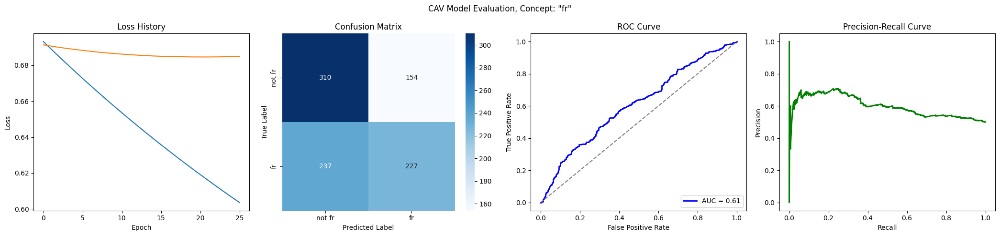

Training run 38/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7021
Epoch 1 Validation Loss: 0.6953
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6674
Epoch 11 Validation Loss: 0.6815
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6390
Epoch 21 Validation Loss: 0.6695
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6141
Epoch 31 Validation Loss: 0.6605
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5919
Epoch 41 Validation Loss: 0.6535
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5713
Epoch 51 Validation Loss: 0.6475
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5523
Epoch 61 Validation Loss: 0.6430
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5346
Epoch 71 Validation Loss: 0.6397
Model saved to trai

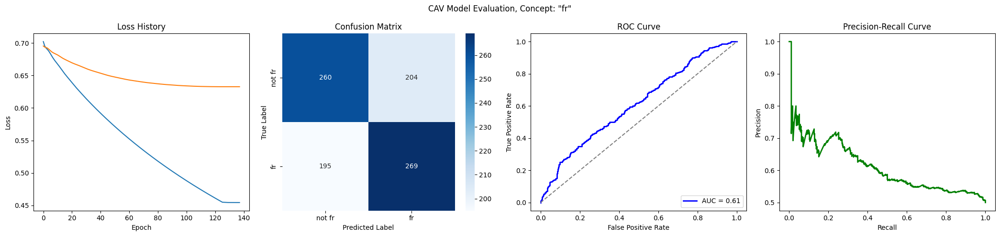

Training run 39/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6916
Epoch 1 Validation Loss: 0.6938
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6497
Epoch 11 Validation Loss: 0.6737
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6149
Epoch 21 Validation Loss: 0.6606
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5857
Epoch 31 Validation Loss: 0.6536
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5604
Epoch 41 Validation Loss: 0.6505
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5379
Epoch 51 Validation Loss: 0.6495
Model saved to trainings/language_fr/state_dict.pth
Early stopping at epoch 58
Loss history saved to trainings/language_fr/loss_history.json


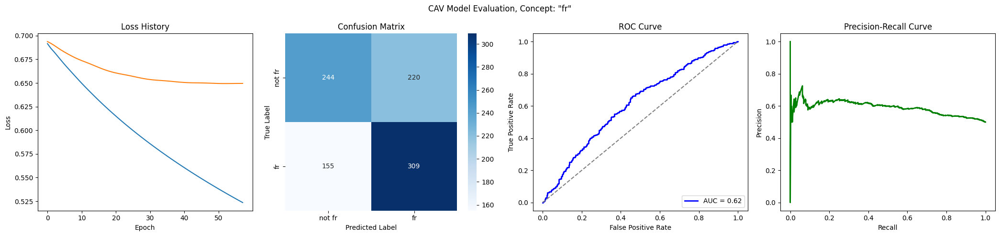

Training run 40/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6956
Epoch 1 Validation Loss: 0.6921
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6517
Epoch 11 Validation Loss: 0.6814
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6150
Epoch 21 Validation Loss: 0.6748
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5843
Epoch 31 Validation Loss: 0.6711
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5578
Epoch 41 Validation Loss: 0.6691
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5343
Epoch 51 Validation Loss: 0.6680
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5133
Epoch 61 Validation Loss: 0.6674
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4942
Epoch 71 Validation Loss: 0.6672
Epoch 81/500
Epoch 

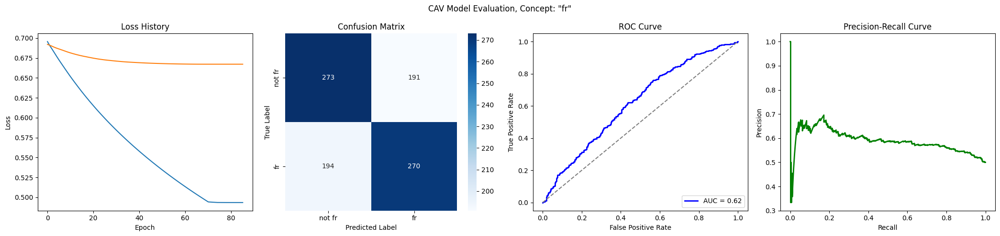

Training run 41/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6984
Epoch 1 Validation Loss: 0.6963
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6596
Epoch 11 Validation Loss: 0.6800
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6267
Epoch 21 Validation Loss: 0.6681
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5980
Epoch 31 Validation Loss: 0.6603
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5725
Epoch 41 Validation Loss: 0.6557
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5496
Epoch 51 Validation Loss: 0.6531
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5287
Epoch 61 Validation Loss: 0.6517
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5096
Epoch 71 Validation Loss: 0.6509
Model saved to trai

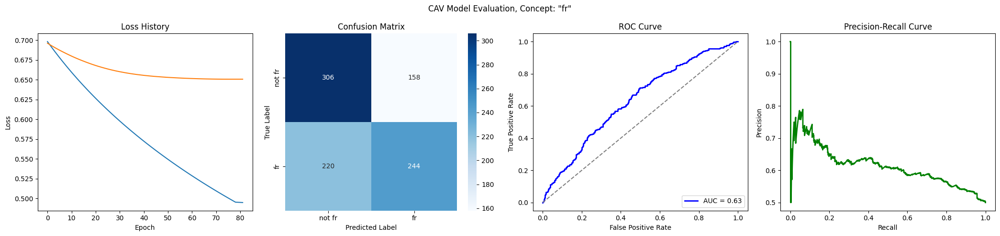

Training run 42/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6959
Epoch 1 Validation Loss: 0.6893
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6478
Epoch 11 Validation Loss: 0.6795
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6091
Epoch 21 Validation Loss: 0.6758
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5836
Epoch 31 Validation Loss: 0.6754
Early stopping at epoch 31
Loss history saved to trainings/language_fr/loss_history.json


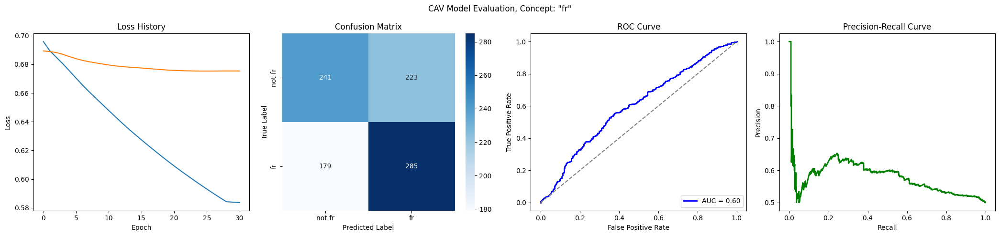

Training run 43/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6938
Epoch 1 Validation Loss: 0.6948
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6527
Epoch 11 Validation Loss: 0.6788
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6198
Epoch 21 Validation Loss: 0.6698
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5920
Epoch 31 Validation Loss: 0.6653
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5676
Epoch 41 Validation Loss: 0.6637
Model saved to trainings/language_fr/state_dict.pth
Early stopping at epoch 49
Loss history saved to trainings/language_fr/loss_history.json


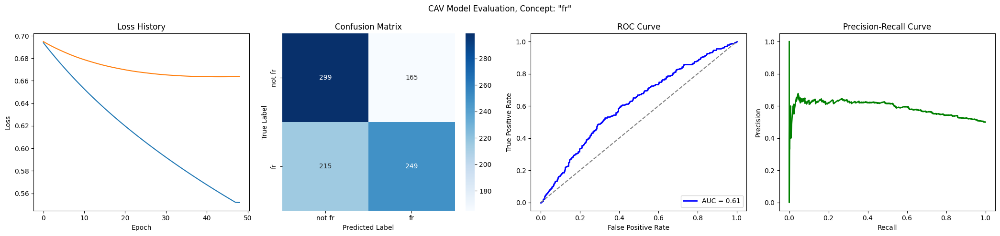

Training run 44/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6966
Epoch 1 Validation Loss: 0.6892
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6574
Epoch 11 Validation Loss: 0.6748
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6245
Epoch 21 Validation Loss: 0.6644
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5957
Epoch 31 Validation Loss: 0.6574
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5702
Epoch 41 Validation Loss: 0.6528
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5473
Epoch 51 Validation Loss: 0.6506
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5266
Epoch 61 Validation Loss: 0.6494
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5079
Epoch 71 Validation Loss: 0.6488
Model saved to trai

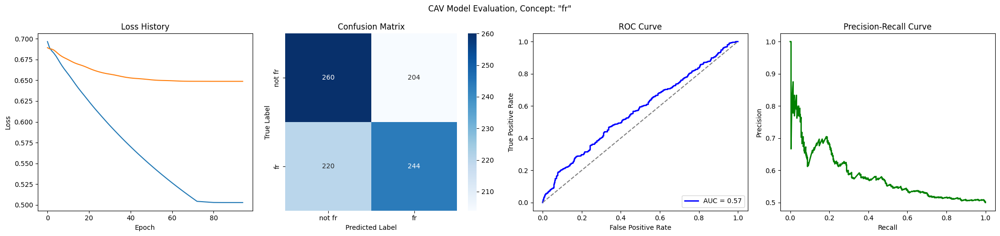

Training run 45/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6884
Epoch 1 Validation Loss: 0.6893
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6461
Epoch 11 Validation Loss: 0.6805
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6107
Epoch 21 Validation Loss: 0.6759
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5807
Epoch 31 Validation Loss: 0.6733
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5545
Epoch 41 Validation Loss: 0.6713
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5311
Epoch 51 Validation Loss: 0.6697
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5101
Epoch 61 Validation Loss: 0.6688
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4909
Epoch 71 Validation Loss: 0.6685
Model saved to trai

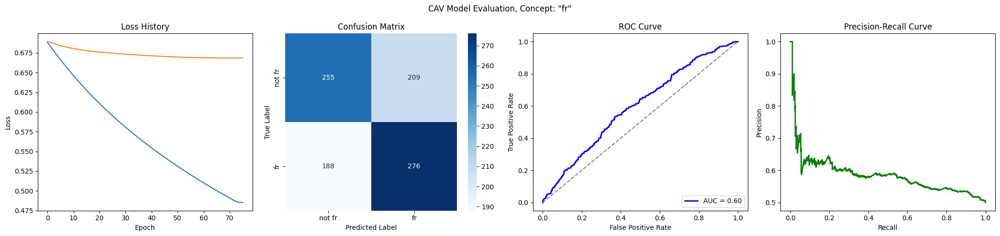

Training run 46/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6974
Epoch 1 Validation Loss: 0.6938
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6608
Epoch 11 Validation Loss: 0.6868
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6306
Epoch 21 Validation Loss: 0.6811
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6048
Epoch 31 Validation Loss: 0.6773
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5819
Epoch 41 Validation Loss: 0.6738
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5613
Epoch 51 Validation Loss: 0.6709
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5425
Epoch 61 Validation Loss: 0.6688
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5252
Epoch 71 Validation Loss: 0.6672
Model saved to trai

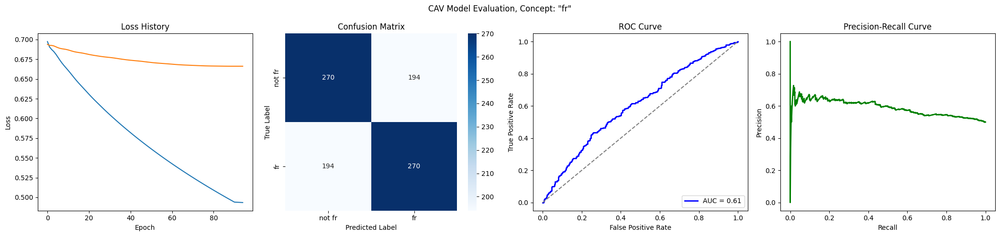

Training run 47/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6973
Epoch 1 Validation Loss: 0.6923
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6585
Epoch 11 Validation Loss: 0.6849
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6272
Epoch 21 Validation Loss: 0.6798
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6006
Epoch 31 Validation Loss: 0.6765
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5770
Epoch 41 Validation Loss: 0.6739
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5557
Epoch 51 Validation Loss: 0.6718
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5363
Epoch 61 Validation Loss: 0.6702
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5185
Epoch 71 Validation Loss: 0.6689
Model saved to trai

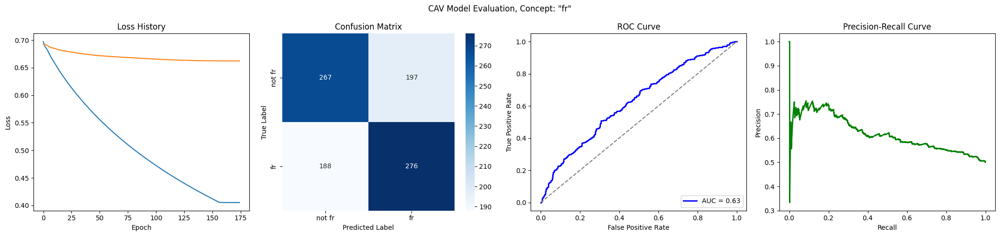

Training run 48/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6953
Epoch 1 Validation Loss: 0.6970
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6542
Epoch 11 Validation Loss: 0.6875
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6215
Epoch 21 Validation Loss: 0.6817
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5933
Epoch 31 Validation Loss: 0.6762
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5685
Epoch 41 Validation Loss: 0.6712
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5463
Epoch 51 Validation Loss: 0.6677
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5263
Epoch 61 Validation Loss: 0.6659
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5080
Epoch 71 Validation Loss: 0.6653
Model saved to trai

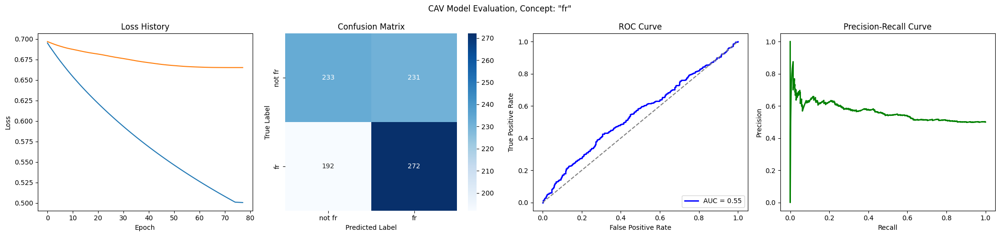

Training run 49/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6897
Epoch 1 Validation Loss: 0.6902
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6464
Epoch 11 Validation Loss: 0.6757
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6137
Epoch 21 Validation Loss: 0.6668
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5875
Epoch 31 Validation Loss: 0.6606
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5652
Epoch 41 Validation Loss: 0.6561
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5454
Epoch 51 Validation Loss: 0.6536
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5275
Epoch 61 Validation Loss: 0.6527
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5201
Epoch 71 Validation Loss: 0.6526
Model saved to trai

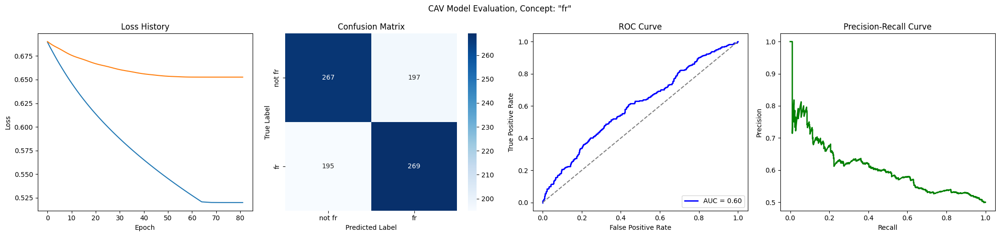

Training run 50/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6960
Epoch 1 Validation Loss: 0.6928
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6455
Epoch 11 Validation Loss: 0.6783
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6062
Epoch 21 Validation Loss: 0.6717
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5754
Epoch 31 Validation Loss: 0.6699
Model saved to trainings/language_fr/state_dict.pth
Early stopping at epoch 36
Loss history saved to trainings/language_fr/loss_history.json


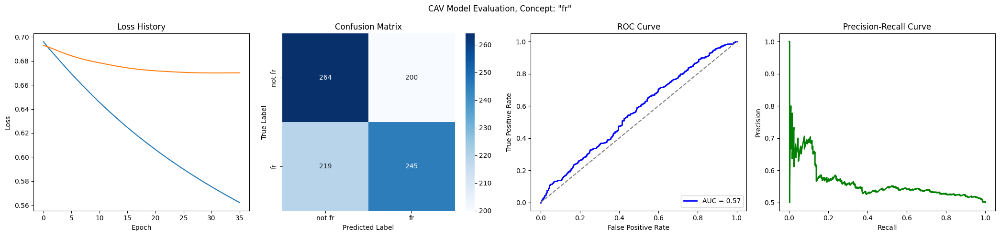

Training run 51/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6955
Epoch 1 Validation Loss: 0.6935
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6594
Epoch 11 Validation Loss: 0.6839
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6281
Epoch 21 Validation Loss: 0.6787
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6007
Epoch 31 Validation Loss: 0.6774
Model saved to trainings/language_fr/state_dict.pth
Early stopping at epoch 39
Loss history saved to trainings/language_fr/loss_history.json


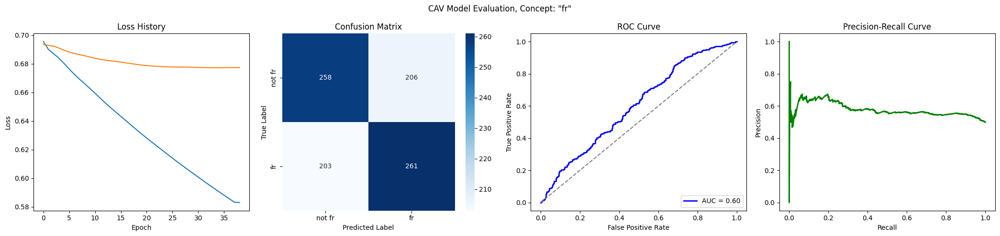

Training run 52/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7024
Epoch 1 Validation Loss: 0.6937
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6577
Epoch 11 Validation Loss: 0.6774
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6194
Epoch 21 Validation Loss: 0.6625
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5860
Epoch 31 Validation Loss: 0.6516
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5570
Epoch 41 Validation Loss: 0.6431
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5316
Epoch 51 Validation Loss: 0.6359
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5091
Epoch 61 Validation Loss: 0.6303
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4890
Epoch 71 Validation Loss: 0.6259
Model saved to trai

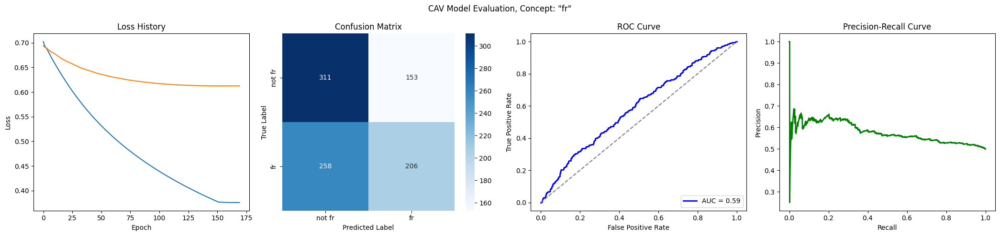

Training run 53/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6948
Epoch 1 Validation Loss: 0.6923
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6533
Epoch 11 Validation Loss: 0.6713
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6210
Epoch 21 Validation Loss: 0.6574
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5950
Epoch 31 Validation Loss: 0.6484
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5727
Epoch 41 Validation Loss: 0.6421
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5528
Epoch 51 Validation Loss: 0.6375
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5345
Epoch 61 Validation Loss: 0.6340
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5176
Epoch 71 Validation Loss: 0.6314
Model saved to trai

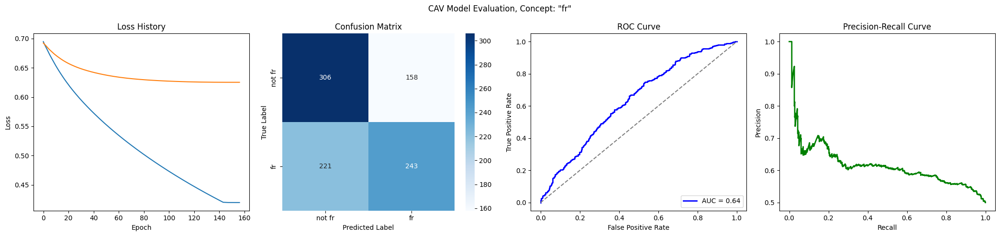

Training run 54/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6997
Epoch 1 Validation Loss: 0.6947
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6598
Epoch 11 Validation Loss: 0.6803
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6257
Epoch 21 Validation Loss: 0.6699
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5958
Epoch 31 Validation Loss: 0.6637
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5694
Epoch 41 Validation Loss: 0.6599
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5458
Epoch 51 Validation Loss: 0.6580
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5244
Epoch 61 Validation Loss: 0.6568
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5049
Epoch 71 Validation Loss: 0.6558
Model saved to trai

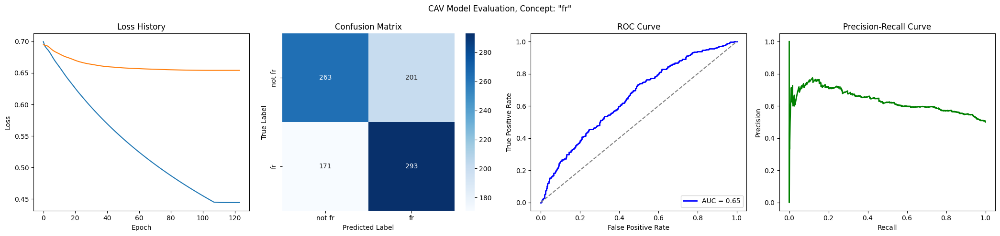

Training run 55/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6913
Epoch 1 Validation Loss: 0.6915
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6471
Epoch 11 Validation Loss: 0.6669
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6125
Epoch 21 Validation Loss: 0.6490
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5839
Epoch 31 Validation Loss: 0.6366
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5590
Epoch 41 Validation Loss: 0.6278
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5370
Epoch 51 Validation Loss: 0.6213
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5172
Epoch 61 Validation Loss: 0.6164
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4993
Epoch 71 Validation Loss: 0.6125
Model saved to trai

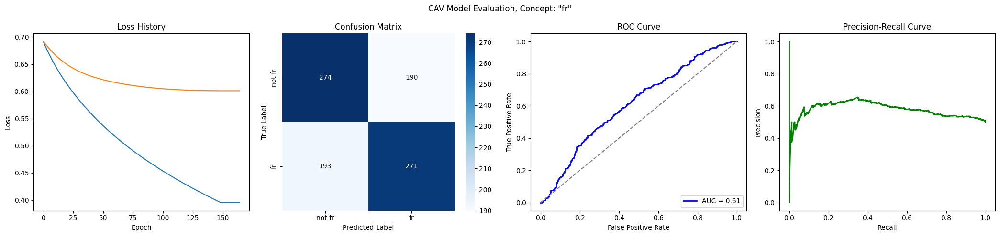

Training run 56/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6977
Epoch 1 Validation Loss: 0.6878
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6549
Epoch 11 Validation Loss: 0.6826
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6217
Epoch 21 Validation Loss: 0.6803
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5939
Epoch 31 Validation Loss: 0.6776
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5695
Epoch 41 Validation Loss: 0.6738
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5477
Epoch 51 Validation Loss: 0.6711
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5281
Epoch 61 Validation Loss: 0.6697
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5104
Epoch 71 Validation Loss: 0.6694
Early stopping at e

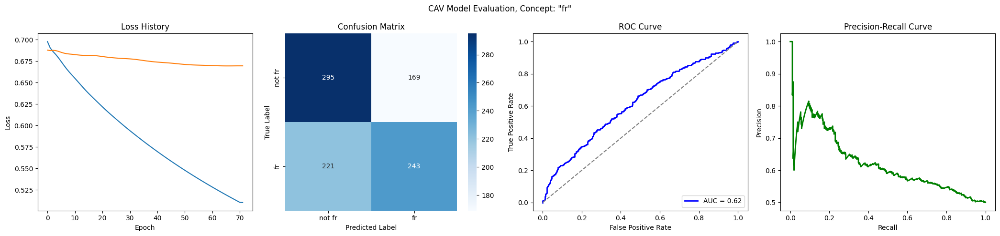

Training run 57/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6956
Epoch 1 Validation Loss: 0.6897
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6501
Epoch 11 Validation Loss: 0.6570
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6148
Epoch 21 Validation Loss: 0.6352
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5864
Epoch 31 Validation Loss: 0.6217
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5622
Epoch 41 Validation Loss: 0.6138
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5406
Epoch 51 Validation Loss: 0.6090
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5209
Epoch 61 Validation Loss: 0.6058
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5028
Epoch 71 Validation Loss: 0.6035
Model saved to trai

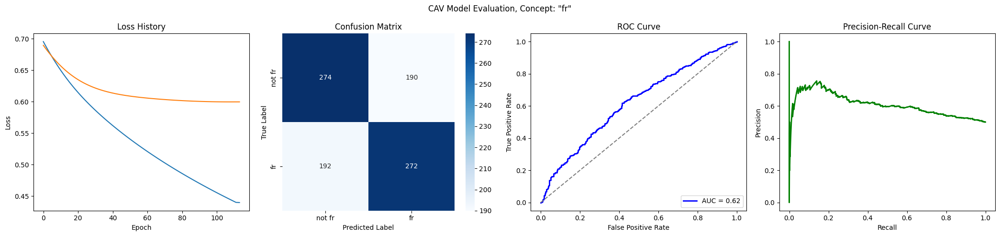

Training run 58/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6956
Epoch 1 Validation Loss: 0.6909
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6522
Epoch 11 Validation Loss: 0.6743
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6171
Epoch 21 Validation Loss: 0.6635
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5879
Epoch 31 Validation Loss: 0.6560
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5625
Epoch 41 Validation Loss: 0.6502
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5399
Epoch 51 Validation Loss: 0.6452
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5195
Epoch 61 Validation Loss: 0.6408
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5009
Epoch 71 Validation Loss: 0.6369
Model saved to trai

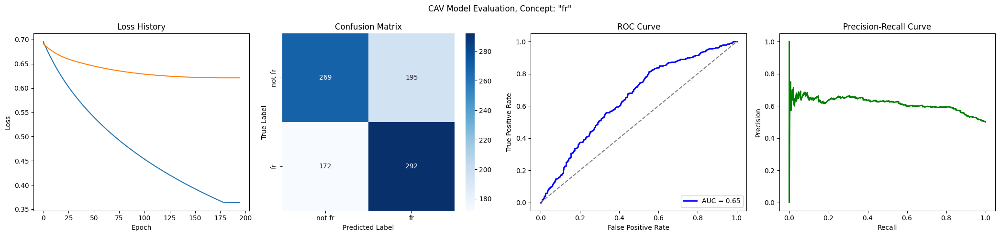

Training run 59/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6968
Epoch 1 Validation Loss: 0.6929
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6479
Epoch 11 Validation Loss: 0.6771
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6095
Epoch 21 Validation Loss: 0.6672
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5787
Epoch 31 Validation Loss: 0.6599
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5526
Epoch 41 Validation Loss: 0.6538
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5298
Epoch 51 Validation Loss: 0.6492
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5094
Epoch 61 Validation Loss: 0.6464
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4909
Epoch 71 Validation Loss: 0.6453
Model saved to trai

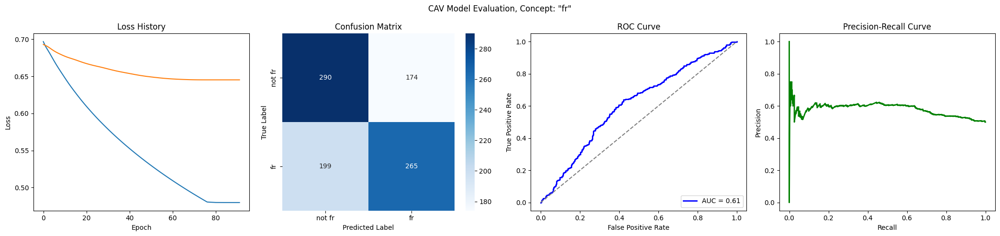

Training run 60/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6936
Epoch 1 Validation Loss: 0.6923
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6574
Epoch 11 Validation Loss: 0.6804
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6269
Epoch 21 Validation Loss: 0.6719
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6008
Epoch 31 Validation Loss: 0.6658
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5780
Epoch 41 Validation Loss: 0.6611
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5578
Epoch 51 Validation Loss: 0.6571
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5396
Epoch 61 Validation Loss: 0.6539
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5230
Epoch 71 Validation Loss: 0.6512
Model saved to trai

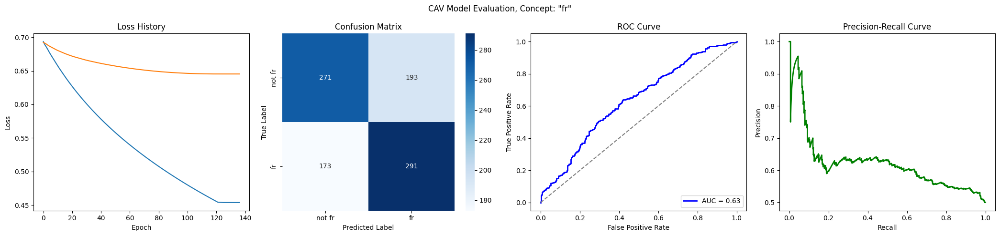

Training run 61/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6956
Epoch 1 Validation Loss: 0.6972
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6534
Epoch 11 Validation Loss: 0.6788
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6173
Epoch 21 Validation Loss: 0.6653
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5860
Epoch 31 Validation Loss: 0.6558
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5585
Epoch 41 Validation Loss: 0.6490
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5340
Epoch 51 Validation Loss: 0.6439
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5120
Epoch 61 Validation Loss: 0.6400
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4920
Epoch 71 Validation Loss: 0.6372
Model saved to trai

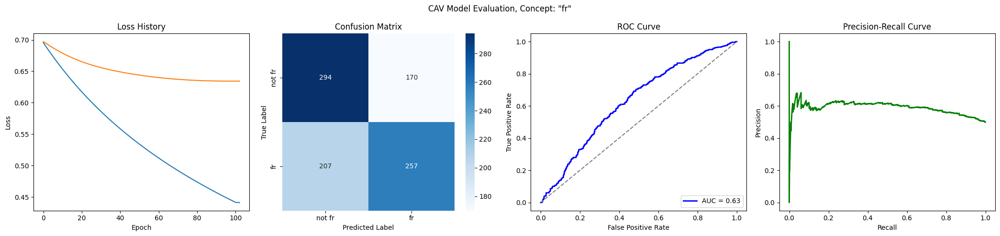

Training run 62/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6958
Epoch 1 Validation Loss: 0.6938
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6572
Epoch 11 Validation Loss: 0.6848
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6244
Epoch 21 Validation Loss: 0.6779
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5959
Epoch 31 Validation Loss: 0.6714
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5707
Epoch 41 Validation Loss: 0.6659
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5484
Epoch 51 Validation Loss: 0.6622
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5283
Epoch 61 Validation Loss: 0.6601
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5101
Epoch 71 Validation Loss: 0.6591
Model saved to trai

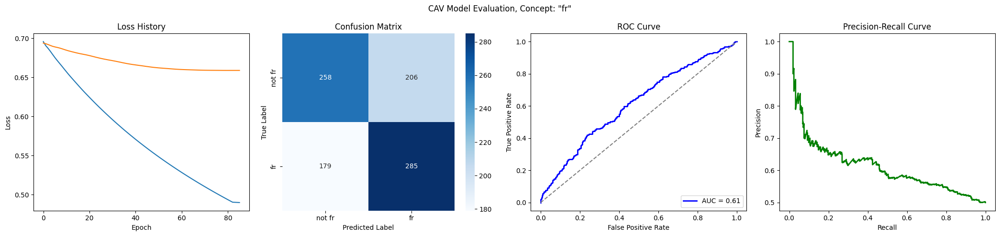

Training run 63/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6915
Epoch 1 Validation Loss: 0.6897
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6528
Epoch 11 Validation Loss: 0.6773
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6206
Epoch 21 Validation Loss: 0.6687
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5929
Epoch 31 Validation Loss: 0.6623
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5682
Epoch 41 Validation Loss: 0.6574
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5458
Epoch 51 Validation Loss: 0.6541
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5253
Epoch 61 Validation Loss: 0.6522
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5063
Epoch 71 Validation Loss: 0.6513
Model saved to trai

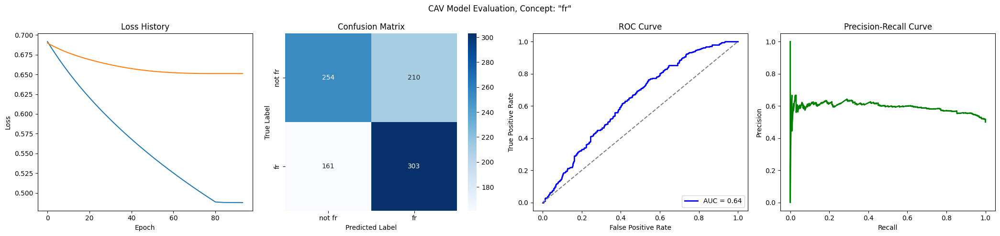

Training run 64/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6992
Epoch 1 Validation Loss: 0.6985
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6634
Epoch 11 Validation Loss: 0.6926
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6332
Epoch 21 Validation Loss: 0.6885
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6078
Epoch 31 Validation Loss: 0.6844
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5854
Epoch 41 Validation Loss: 0.6792
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5653
Epoch 51 Validation Loss: 0.6733
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5469
Epoch 61 Validation Loss: 0.6671
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5298
Epoch 71 Validation Loss: 0.6614
Model saved to trai

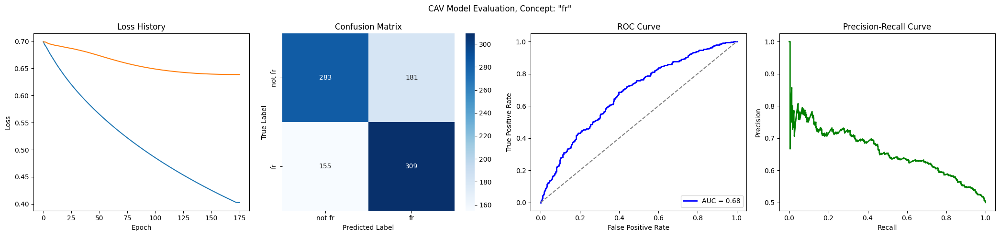

Training run 65/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6963
Epoch 1 Validation Loss: 0.6926
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6521
Epoch 11 Validation Loss: 0.6717
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6152
Epoch 21 Validation Loss: 0.6567
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5843
Epoch 31 Validation Loss: 0.6461
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5577
Epoch 41 Validation Loss: 0.6383
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5342
Epoch 51 Validation Loss: 0.6321
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5132
Epoch 61 Validation Loss: 0.6267
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4942
Epoch 71 Validation Loss: 0.6220
Model saved to trai

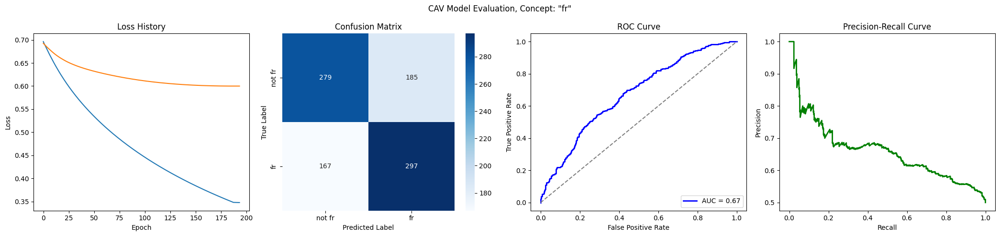

Training run 66/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6916
Epoch 1 Validation Loss: 0.6891
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6568
Epoch 11 Validation Loss: 0.6718
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6270
Epoch 21 Validation Loss: 0.6605
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6006
Epoch 31 Validation Loss: 0.6535
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5768
Epoch 41 Validation Loss: 0.6490
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5549
Epoch 51 Validation Loss: 0.6461
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5347
Epoch 61 Validation Loss: 0.6441
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5160
Epoch 71 Validation Loss: 0.6427
Model saved to trai

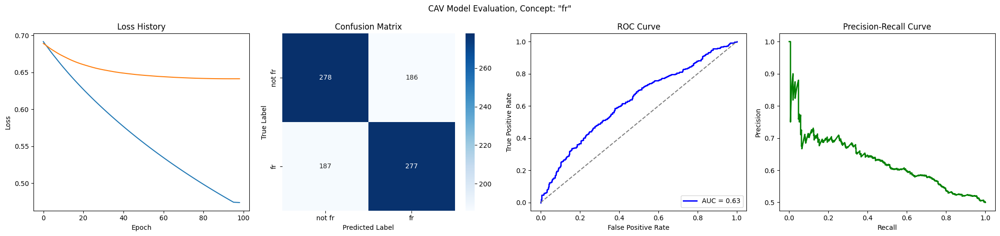

Training run 67/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6964
Epoch 1 Validation Loss: 0.6922
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6539
Epoch 11 Validation Loss: 0.6779
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6182
Epoch 21 Validation Loss: 0.6678
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5875
Epoch 31 Validation Loss: 0.6606
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5605
Epoch 41 Validation Loss: 0.6551
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5365
Epoch 51 Validation Loss: 0.6508
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5149
Epoch 61 Validation Loss: 0.6475
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4953
Epoch 71 Validation Loss: 0.6452
Model saved to trai

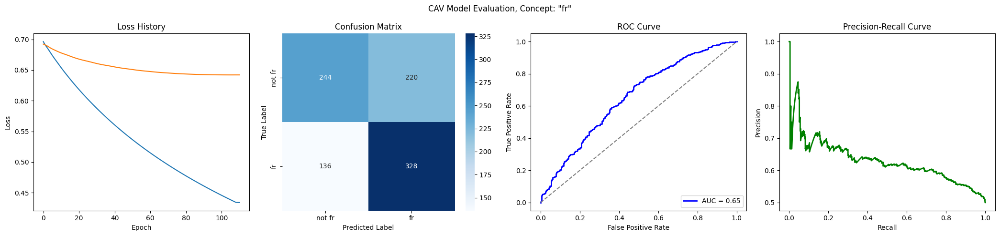

Training run 68/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6921
Epoch 1 Validation Loss: 0.6961
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6565
Epoch 11 Validation Loss: 0.6838
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6266
Epoch 21 Validation Loss: 0.6773
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6005
Epoch 31 Validation Loss: 0.6744
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5772
Epoch 41 Validation Loss: 0.6735
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5617
Epoch 51 Validation Loss: 0.6735
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5614
Epoch 61 Validation Loss: 0.6735
Model saved to trainings/language_fr/state_dict.pth
Early stopping at epoch 66
Loss history saved to trainings/language_fr/loss_history.json


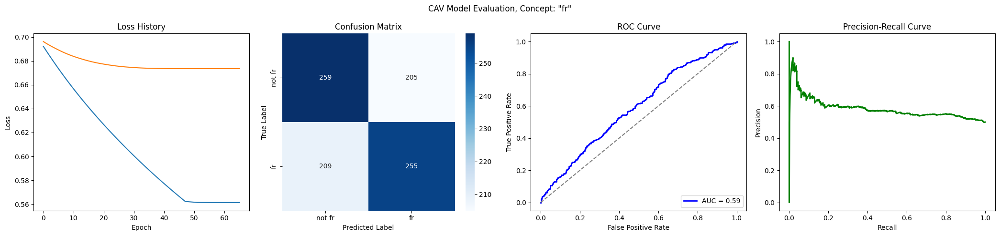

Training run 69/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7014
Epoch 1 Validation Loss: 0.6941
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6611
Epoch 11 Validation Loss: 0.6815
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6283
Epoch 21 Validation Loss: 0.6709
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6010
Epoch 31 Validation Loss: 0.6631
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5770
Epoch 41 Validation Loss: 0.6568
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5554
Epoch 51 Validation Loss: 0.6513
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5356
Epoch 61 Validation Loss: 0.6466
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5175
Epoch 71 Validation Loss: 0.6426
Model saved to trai

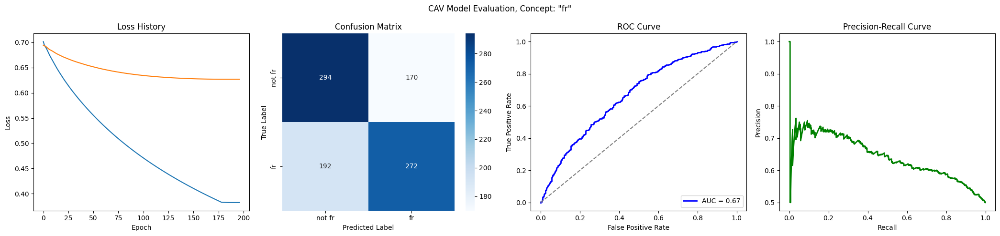

Training run 70/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7004
Epoch 1 Validation Loss: 0.6911
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6593
Epoch 11 Validation Loss: 0.6756
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6249
Epoch 21 Validation Loss: 0.6671
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5955
Epoch 31 Validation Loss: 0.6640
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5739
Epoch 41 Validation Loss: 0.6639
Early stopping at epoch 41
Loss history saved to trainings/language_fr/loss_history.json


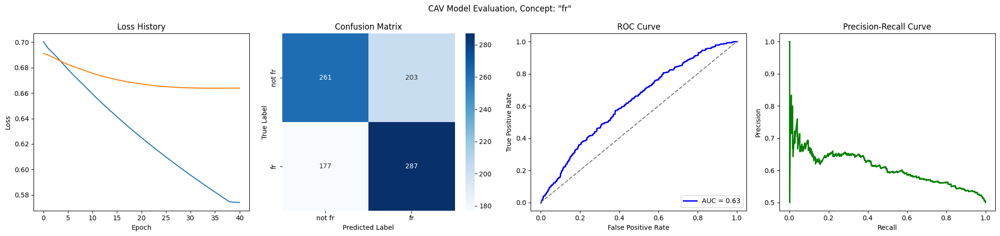

Training run 71/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6951
Epoch 1 Validation Loss: 0.6931
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6510
Epoch 11 Validation Loss: 0.6773
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6171
Epoch 21 Validation Loss: 0.6671
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5895
Epoch 31 Validation Loss: 0.6605
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5655
Epoch 41 Validation Loss: 0.6560
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5440
Epoch 51 Validation Loss: 0.6529
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5244
Epoch 61 Validation Loss: 0.6509
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5065
Epoch 71 Validation Loss: 0.6497
Model saved to trai

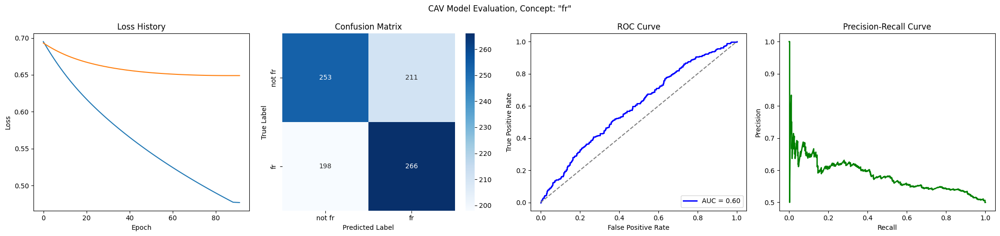

Training run 72/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6923
Epoch 1 Validation Loss: 0.6915
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6548
Epoch 11 Validation Loss: 0.6739
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6226
Epoch 21 Validation Loss: 0.6603
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5945
Epoch 31 Validation Loss: 0.6501
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5698
Epoch 41 Validation Loss: 0.6424
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5476
Epoch 51 Validation Loss: 0.6366
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5274
Epoch 61 Validation Loss: 0.6318
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5090
Epoch 71 Validation Loss: 0.6280
Model saved to trai

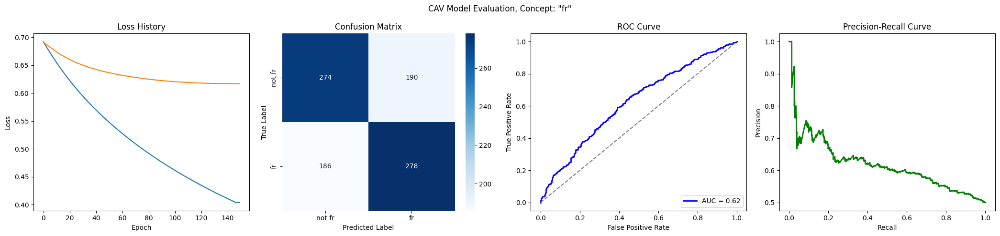

Training run 73/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6994
Epoch 1 Validation Loss: 0.6979
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6598
Epoch 11 Validation Loss: 0.6739
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6251
Epoch 21 Validation Loss: 0.6537
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5950
Epoch 31 Validation Loss: 0.6382
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5686
Epoch 41 Validation Loss: 0.6263
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5451
Epoch 51 Validation Loss: 0.6172
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5240
Epoch 61 Validation Loss: 0.6101
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5048
Epoch 71 Validation Loss: 0.6043
Model saved to trai

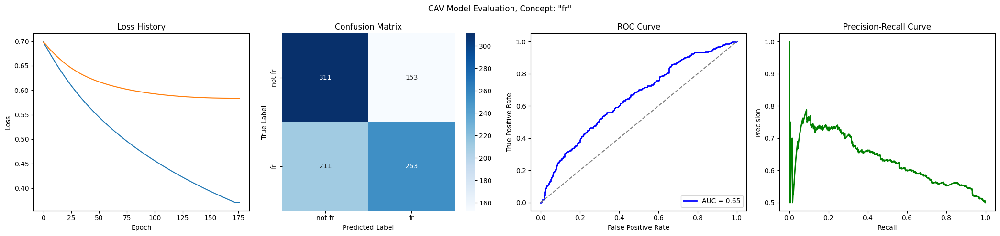

Training run 74/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6937
Epoch 1 Validation Loss: 0.6926
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6542
Epoch 11 Validation Loss: 0.6748
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6205
Epoch 21 Validation Loss: 0.6632
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5909
Epoch 31 Validation Loss: 0.6556
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5644
Epoch 41 Validation Loss: 0.6503
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5405
Epoch 51 Validation Loss: 0.6465
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5187
Epoch 61 Validation Loss: 0.6437
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4987
Epoch 71 Validation Loss: 0.6415
Model saved to trai

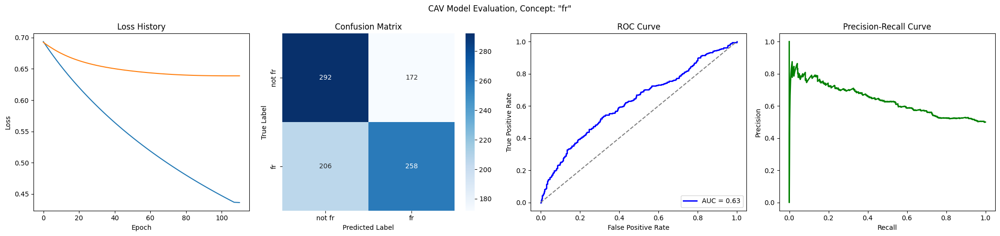

Training run 75/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7087
Epoch 1 Validation Loss: 0.6963
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6671
Epoch 11 Validation Loss: 0.6761
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6413
Epoch 21 Validation Loss: 0.6643
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6187
Epoch 31 Validation Loss: 0.6561
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5985
Epoch 41 Validation Loss: 0.6501
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5801
Epoch 51 Validation Loss: 0.6458
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5631
Epoch 61 Validation Loss: 0.6425
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5474
Epoch 71 Validation Loss: 0.6399
Model saved to trai

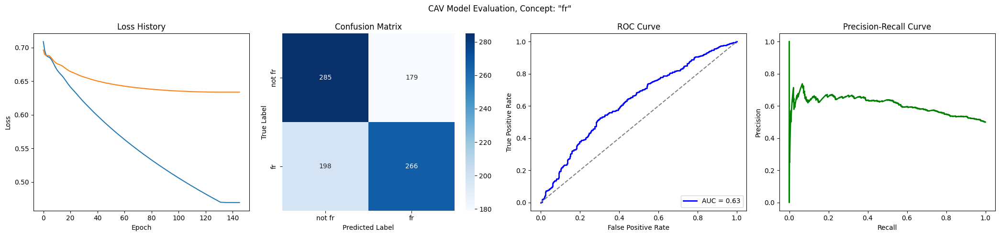

Training run 76/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6900
Epoch 1 Validation Loss: 0.6846
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6424
Epoch 11 Validation Loss: 0.6663
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6046
Epoch 21 Validation Loss: 0.6554
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5737
Epoch 31 Validation Loss: 0.6488
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5474
Epoch 41 Validation Loss: 0.6444
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5241
Epoch 51 Validation Loss: 0.6413
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5032
Epoch 61 Validation Loss: 0.6392
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4841
Epoch 71 Validation Loss: 0.6380
Model saved to trai

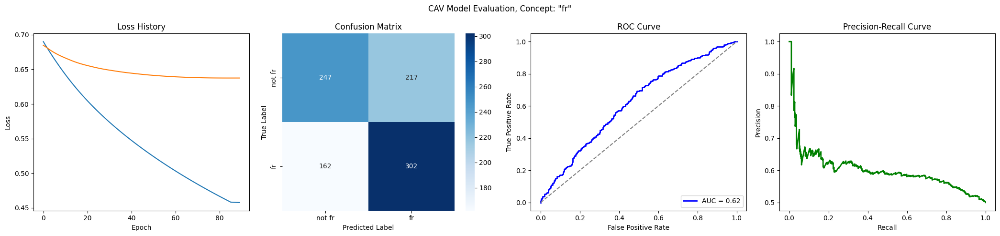

Training run 77/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6953
Epoch 1 Validation Loss: 0.6926
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6445
Epoch 11 Validation Loss: 0.6776
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6038
Epoch 21 Validation Loss: 0.6696
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5713
Epoch 31 Validation Loss: 0.6657
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5444
Epoch 41 Validation Loss: 0.6640
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5213
Epoch 51 Validation Loss: 0.6633
Model saved to trainings/language_fr/state_dict.pth
Early stopping at epoch 58
Loss history saved to trainings/language_fr/loss_history.json


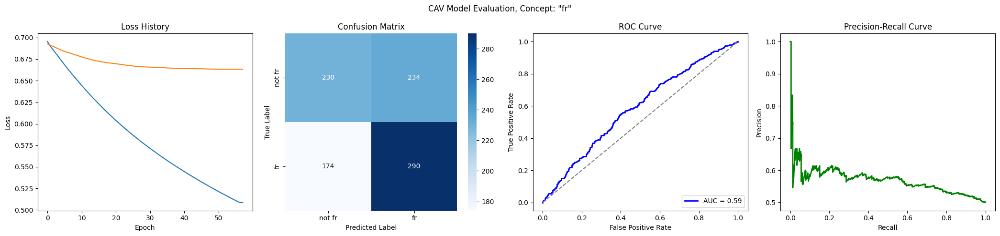

Training run 78/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6982
Epoch 1 Validation Loss: 0.6939
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6599
Epoch 11 Validation Loss: 0.6798
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6286
Epoch 21 Validation Loss: 0.6707
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6025
Epoch 31 Validation Loss: 0.6650
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5795
Epoch 41 Validation Loss: 0.6608
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5589
Epoch 51 Validation Loss: 0.6572
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5400
Epoch 61 Validation Loss: 0.6539
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5228
Epoch 71 Validation Loss: 0.6511
Model saved to trai

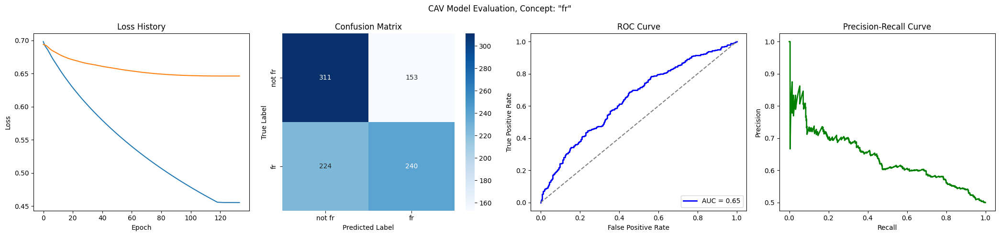

Training run 79/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6891
Epoch 1 Validation Loss: 0.6886
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6414
Epoch 11 Validation Loss: 0.6787
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6033
Epoch 21 Validation Loss: 0.6743
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5719
Epoch 31 Validation Loss: 0.6722
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5451
Epoch 41 Validation Loss: 0.6710
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5216
Epoch 51 Validation Loss: 0.6704
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5006
Epoch 61 Validation Loss: 0.6703
Early stopping at epoch 63
Loss history saved to trainings/language_fr/loss_history.json


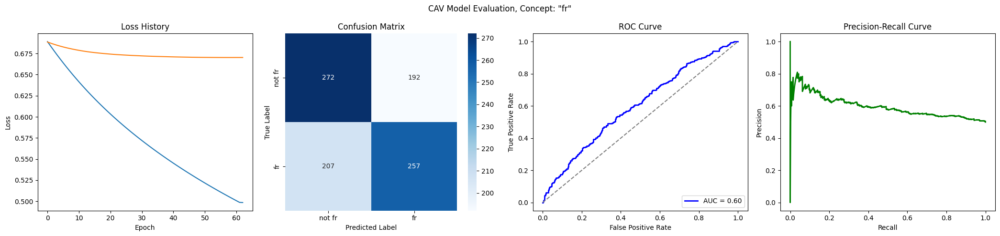

Training run 80/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6949
Epoch 1 Validation Loss: 0.6920
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6577
Epoch 11 Validation Loss: 0.6828
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6253
Epoch 21 Validation Loss: 0.6765
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5972
Epoch 31 Validation Loss: 0.6734
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5722
Epoch 41 Validation Loss: 0.6721
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5537
Epoch 51 Validation Loss: 0.6717
Early stopping at epoch 51
Loss history saved to trainings/language_fr/loss_history.json


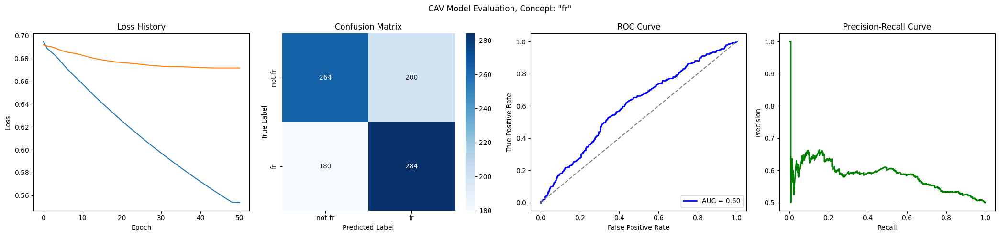

Training run 81/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6913
Epoch 1 Validation Loss: 0.6880
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6538
Epoch 11 Validation Loss: 0.6798
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6237
Epoch 21 Validation Loss: 0.6758
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5985
Epoch 31 Validation Loss: 0.6737
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5767
Epoch 41 Validation Loss: 0.6726
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5573
Epoch 51 Validation Loss: 0.6722
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5398
Epoch 61 Validation Loss: 0.6718
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5237
Epoch 71 Validation Loss: 0.6715
Model saved to trai

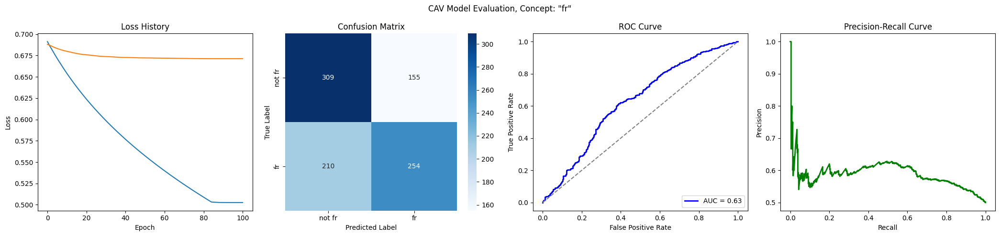

Training run 82/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6933
Epoch 1 Validation Loss: 0.6874
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6422
Epoch 11 Validation Loss: 0.6798
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6005
Epoch 21 Validation Loss: 0.6775
Model saved to trainings/language_fr/state_dict.pth
Early stopping at epoch 29
Loss history saved to trainings/language_fr/loss_history.json


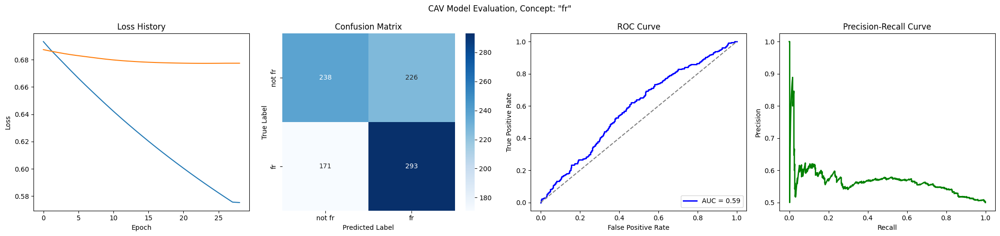

Training run 83/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6925
Epoch 1 Validation Loss: 0.6896
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6545
Epoch 11 Validation Loss: 0.6748
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6223
Epoch 21 Validation Loss: 0.6639
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5946
Epoch 31 Validation Loss: 0.6555
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5702
Epoch 41 Validation Loss: 0.6482
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5480
Epoch 51 Validation Loss: 0.6416
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5279
Epoch 61 Validation Loss: 0.6361
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5093
Epoch 71 Validation Loss: 0.6317
Model saved to trai

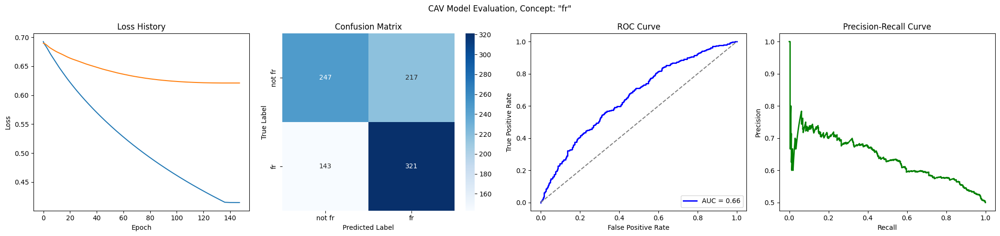

Training run 84/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6998
Epoch 1 Validation Loss: 0.6966
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6555
Epoch 11 Validation Loss: 0.6849
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6208
Epoch 21 Validation Loss: 0.6771
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5900
Epoch 31 Validation Loss: 0.6726
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5629
Epoch 41 Validation Loss: 0.6687
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5391
Epoch 51 Validation Loss: 0.6657
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5180
Epoch 61 Validation Loss: 0.6635
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4991
Epoch 71 Validation Loss: 0.6618
Model saved to trai

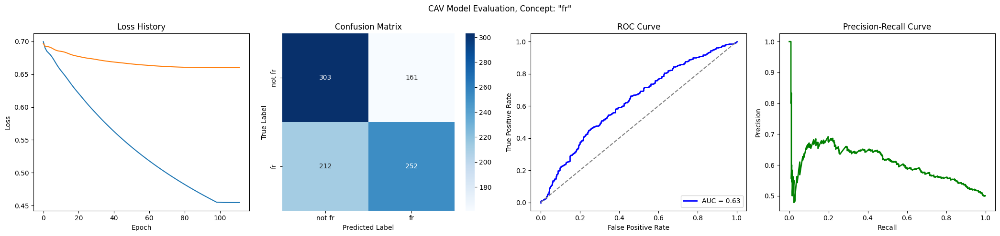

Training run 85/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6945
Epoch 1 Validation Loss: 0.6919
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6538
Epoch 11 Validation Loss: 0.6739
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6198
Epoch 21 Validation Loss: 0.6597
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5906
Epoch 31 Validation Loss: 0.6486
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5649
Epoch 41 Validation Loss: 0.6401
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5419
Epoch 51 Validation Loss: 0.6337
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5211
Epoch 61 Validation Loss: 0.6287
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5022
Epoch 71 Validation Loss: 0.6246
Model saved to trai

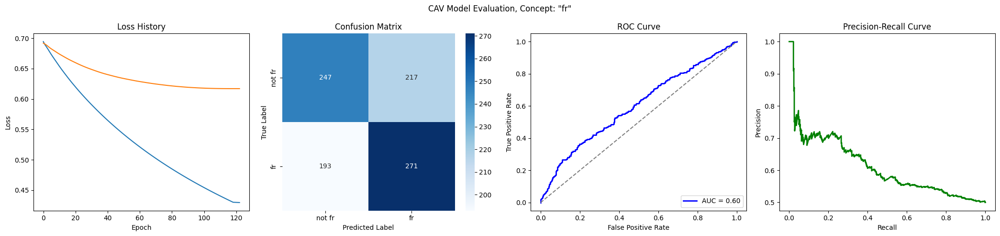

Training run 86/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6910
Epoch 1 Validation Loss: 0.6907
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6415
Epoch 11 Validation Loss: 0.6723
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6005
Epoch 21 Validation Loss: 0.6589
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5660
Epoch 31 Validation Loss: 0.6486
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5362
Epoch 41 Validation Loss: 0.6403
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5102
Epoch 51 Validation Loss: 0.6339
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4870
Epoch 61 Validation Loss: 0.6293
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4661
Epoch 71 Validation Loss: 0.6261
Model saved to trai

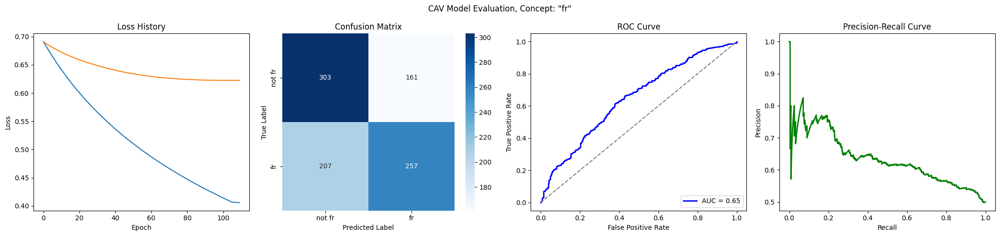

Training run 87/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6927
Epoch 1 Validation Loss: 0.6903
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6538
Epoch 11 Validation Loss: 0.6803
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6207
Epoch 21 Validation Loss: 0.6732
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5921
Epoch 31 Validation Loss: 0.6673
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5668
Epoch 41 Validation Loss: 0.6619
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5440
Epoch 51 Validation Loss: 0.6570
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5233
Epoch 61 Validation Loss: 0.6526
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5043
Epoch 71 Validation Loss: 0.6488
Model saved to trai

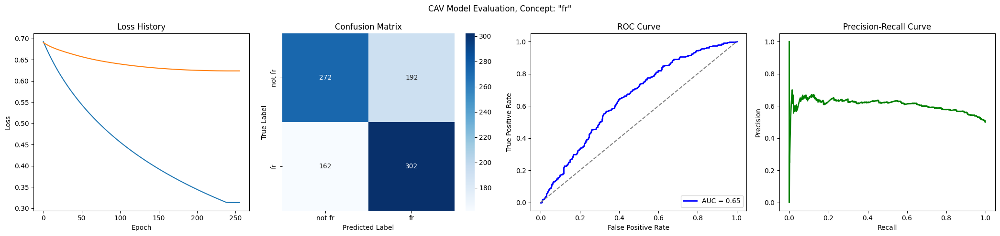

Training run 88/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6952
Epoch 1 Validation Loss: 0.6924
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6517
Epoch 11 Validation Loss: 0.6712
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6167
Epoch 21 Validation Loss: 0.6561
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5876
Epoch 31 Validation Loss: 0.6453
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5622
Epoch 41 Validation Loss: 0.6367
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5394
Epoch 51 Validation Loss: 0.6296
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5189
Epoch 61 Validation Loss: 0.6238
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5001
Epoch 71 Validation Loss: 0.6191
Model saved to trai

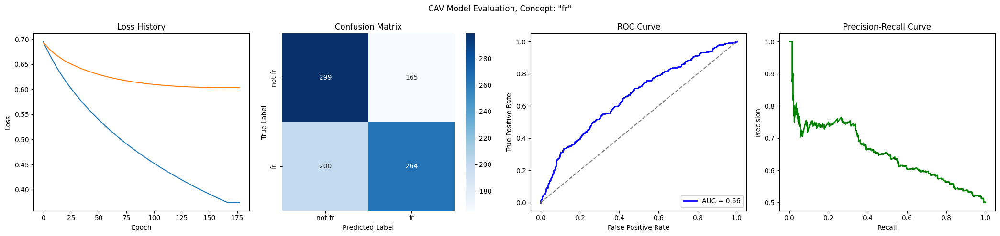

Training run 89/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6947
Epoch 1 Validation Loss: 0.6912
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6487
Epoch 11 Validation Loss: 0.6723
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6108
Epoch 21 Validation Loss: 0.6602
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5797
Epoch 31 Validation Loss: 0.6538
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5532
Epoch 41 Validation Loss: 0.6510
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5301
Epoch 51 Validation Loss: 0.6505
Early stopping at epoch 55
Loss history saved to trainings/language_fr/loss_history.json


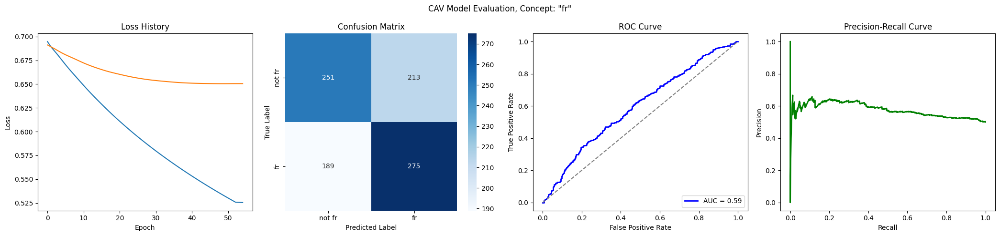

Training run 90/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6959
Epoch 1 Validation Loss: 0.6932
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6538
Epoch 11 Validation Loss: 0.6831
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6173
Epoch 21 Validation Loss: 0.6765
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5856
Epoch 31 Validation Loss: 0.6718
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5578
Epoch 41 Validation Loss: 0.6683
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5331
Epoch 51 Validation Loss: 0.6655
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5108
Epoch 61 Validation Loss: 0.6633
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4905
Epoch 71 Validation Loss: 0.6617
Model saved to trai

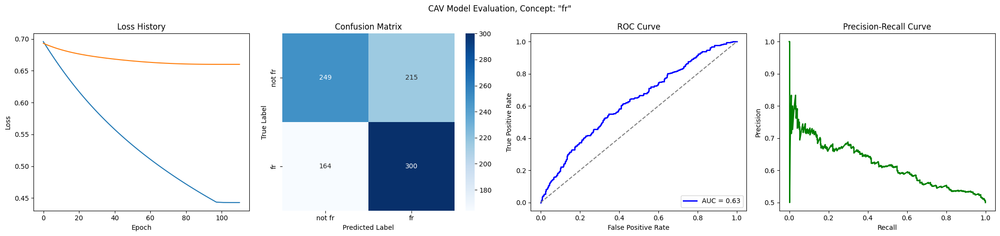

Training run 91/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6913
Epoch 1 Validation Loss: 0.6972
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6476
Epoch 11 Validation Loss: 0.6920
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6115
Epoch 21 Validation Loss: 0.6892
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5805
Epoch 31 Validation Loss: 0.6869
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5532
Epoch 41 Validation Loss: 0.6851
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5289
Epoch 51 Validation Loss: 0.6838
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5070
Epoch 61 Validation Loss: 0.6831
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4872
Epoch 71 Validation Loss: 0.6829
Model saved to trai

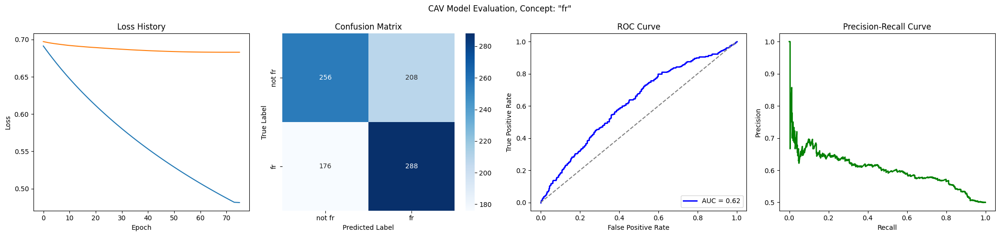

Training run 92/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6917
Epoch 1 Validation Loss: 0.6876
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6488
Epoch 11 Validation Loss: 0.6797
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6136
Epoch 21 Validation Loss: 0.6750
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5841
Epoch 31 Validation Loss: 0.6709
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5586
Epoch 41 Validation Loss: 0.6666
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5361
Epoch 51 Validation Loss: 0.6623
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5160
Epoch 61 Validation Loss: 0.6585
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4977
Epoch 71 Validation Loss: 0.6554
Model saved to trai

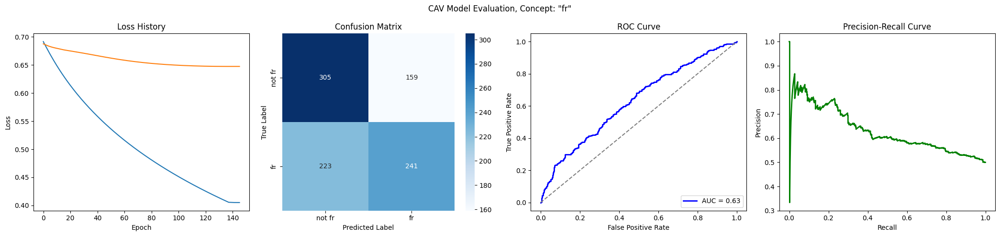

Training run 93/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6969
Epoch 1 Validation Loss: 0.6901
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6569
Epoch 11 Validation Loss: 0.6732
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6235
Epoch 21 Validation Loss: 0.6605
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5945
Epoch 31 Validation Loss: 0.6502
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5690
Epoch 41 Validation Loss: 0.6418
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5461
Epoch 51 Validation Loss: 0.6353
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5254
Epoch 61 Validation Loss: 0.6302
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5063
Epoch 71 Validation Loss: 0.6260
Model saved to trai

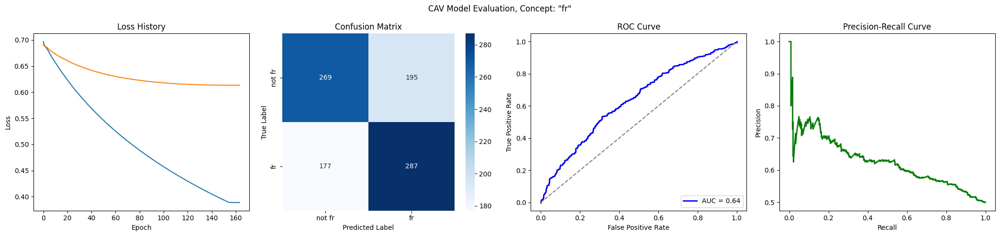

Training run 94/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6919
Epoch 1 Validation Loss: 0.6929
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6544
Epoch 11 Validation Loss: 0.6813
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6221
Epoch 21 Validation Loss: 0.6744
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5939
Epoch 31 Validation Loss: 0.6708
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5691
Epoch 41 Validation Loss: 0.6692
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5469
Epoch 51 Validation Loss: 0.6684
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5268
Epoch 61 Validation Loss: 0.6680
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5084
Epoch 71 Validation Loss: 0.6676
Model saved to trai

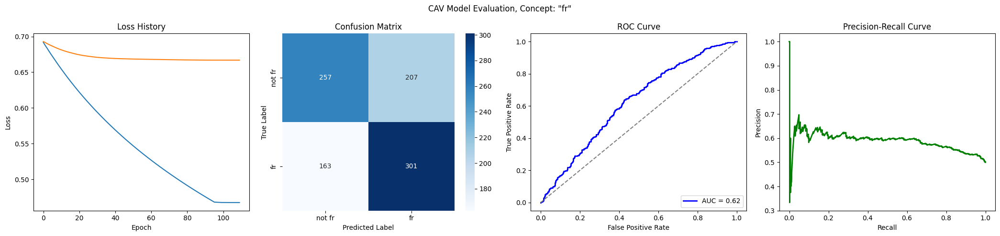

Training run 95/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6991
Epoch 1 Validation Loss: 0.6917
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6585
Epoch 11 Validation Loss: 0.6864
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6265
Epoch 21 Validation Loss: 0.6856
Early stopping at epoch 21
Loss history saved to trainings/language_fr/loss_history.json


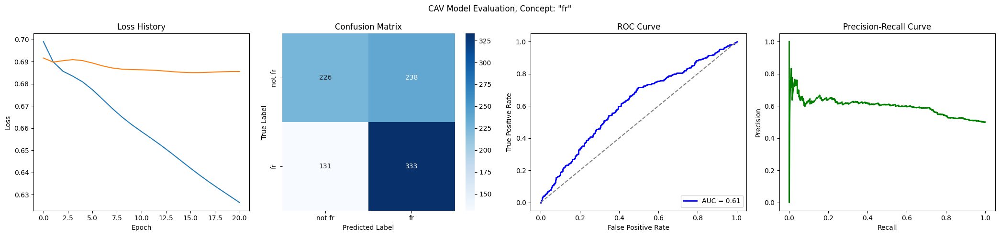

Training run 96/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6972
Epoch 1 Validation Loss: 0.6929
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6535
Epoch 11 Validation Loss: 0.6751
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6179
Epoch 21 Validation Loss: 0.6627
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5885
Epoch 31 Validation Loss: 0.6542
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5632
Epoch 41 Validation Loss: 0.6468
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5409
Epoch 51 Validation Loss: 0.6406
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5209
Epoch 61 Validation Loss: 0.6357
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5027
Epoch 71 Validation Loss: 0.6318
Model saved to trai

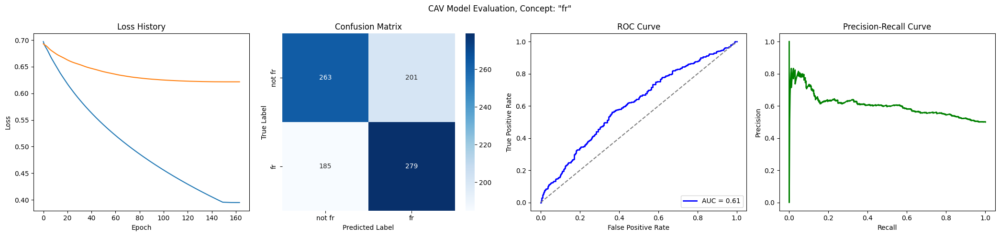

Training run 97/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6967
Epoch 1 Validation Loss: 0.6921
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6619
Epoch 11 Validation Loss: 0.6850
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6318
Epoch 21 Validation Loss: 0.6785
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6052
Epoch 31 Validation Loss: 0.6711
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5814
Epoch 41 Validation Loss: 0.6642
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5600
Epoch 51 Validation Loss: 0.6587
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5405
Epoch 61 Validation Loss: 0.6547
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5228
Epoch 71 Validation Loss: 0.6516
Model saved to trai

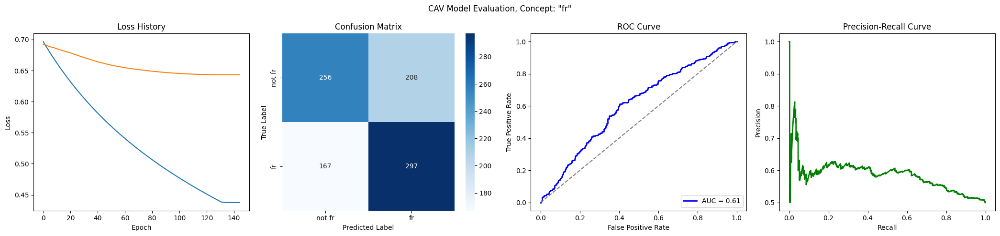

Training run 98/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6983
Epoch 1 Validation Loss: 0.6951
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6617
Epoch 11 Validation Loss: 0.6833
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6312
Epoch 21 Validation Loss: 0.6738
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6051
Epoch 31 Validation Loss: 0.6676
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5822
Epoch 41 Validation Loss: 0.6630
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5617
Epoch 51 Validation Loss: 0.6583
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5430
Epoch 61 Validation Loss: 0.6535
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5259
Epoch 71 Validation Loss: 0.6490
Model saved to trai

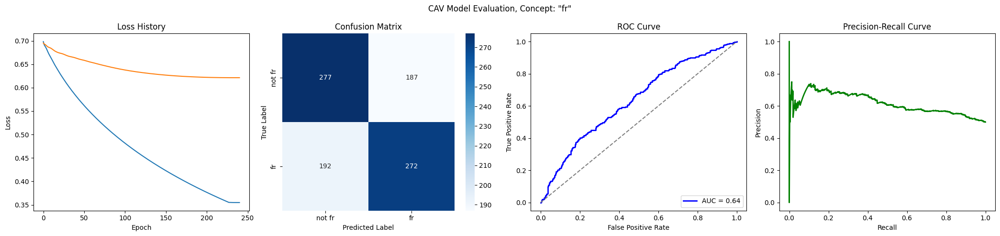

Training run 99/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7003
Epoch 1 Validation Loss: 0.6916
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6653
Epoch 11 Validation Loss: 0.6790
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6365
Epoch 21 Validation Loss: 0.6683
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6114
Epoch 31 Validation Loss: 0.6597
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5892
Epoch 41 Validation Loss: 0.6521
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5692
Epoch 51 Validation Loss: 0.6455
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5510
Epoch 61 Validation Loss: 0.6400
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5343
Epoch 71 Validation Loss: 0.6354
Model saved to trai

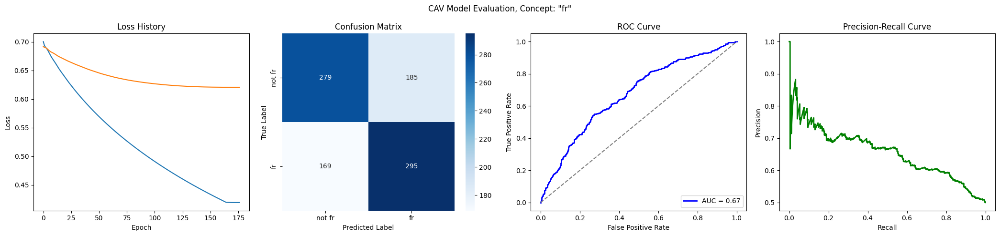

Training run 100/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6961
Epoch 1 Validation Loss: 0.6946
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6562
Epoch 11 Validation Loss: 0.6891
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6229
Epoch 21 Validation Loss: 0.6880
Model saved to trainings/language_fr/state_dict.pth
Early stopping at epoch 27
Loss history saved to trainings/language_fr/loss_history.json


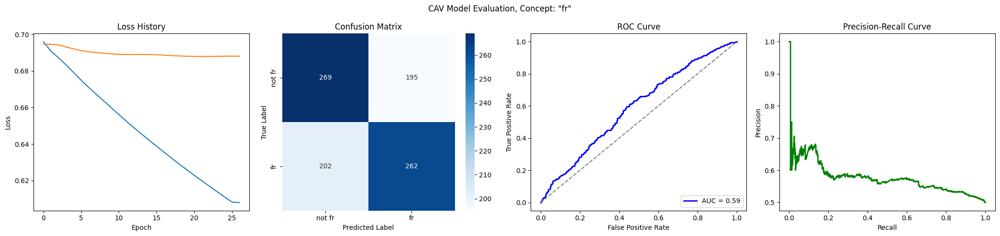

CPU times: user 15min 54s, sys: 14min 48s, total: 30min 43s
Wall time: 2h 38min 38s


In [ ]:
%%time

cav_vectors = []
evaluation_metrics = []

for i in range(num_train_runs):
    print(f"Training run {i + 1}/{num_train_runs}")

    cav_vector, evaluation_metric = train_one_cav(
        train_index=i + 1,
        df=df,
        project_name=project_name,
        encoder_id=encoder_id,
        target_positive_class=target_positive_class,
        training_sample_count=training_sample_count,
        epochs=epochs,
        batch_size=batch_size,
        learning_rate=learning_rate,
        embedding_dim=embedding_dim,
        dropout_rate=dropout_rate,
        test_dataloader=test_dataloader,
    )

    cav_vectors.append(cav_vector)
    evaluation_metrics.append(evaluation_metric)


store_cav_vector_array(cav_vectors, f"cav_ttest_{project_name}.npy", project_name)
store_evaluation_metrics(
    evaluation_metrics, f"evaluation_metrics_ttest_{project_name}.json", project_name
)


## 2. Train CAV for Qualitative Tests


In [ ]:
train_val_split = 0.9

# training parameters
epochs = 500
batch_size = 128
learning_rate = 0.002
embedding_dim = 768
dropout_rate = 0.0

### Prepare Data


In [ ]:
import os

import pandas as pd
import s3fs
from cavmir.training.dataset import (
    create_dataloader_from_webdataset_path,
    create_webdataset,
)
from cavmir.utils import (
    append_embeddings_to_df,
    create_training_samples_from_df,
    train_one_cav,
    store_cav_vector_array,
    store_evaluation_metrics,
)

s3 = s3fs.S3FileSystem(anon=False)

dataset_prefix = os.environ["DATASET_PREFIX"]
embedding_prefix = os.environ["EMBEDDING_PREFIX"]


In [ ]:
# load training set
df = pd.read_csv(os.path.join(dataset_prefix, f"train_dataset_{project_name}.csv"))
df = append_embeddings_to_df(df, embedding_prefix, encoder_id, s3)

training_sample_count = int(len(df) * train_val_split)
validation_sample_count = len(df) - training_sample_count


In [ ]:
validation_sample_count

599

In [ ]:
# create test set for evaluation
df_test = pd.read_csv(os.path.join(dataset_prefix, f"test_dataset_{project_name}.csv"))
df_test = append_embeddings_to_df(df_test, embedding_prefix, encoder_id, s3)

create_webdataset(
    create_training_samples_from_df(df_test),
    f"datasets/{encoder_id}_test_{project_name}.tar",
)

test_dataloader = create_dataloader_from_webdataset_path(
    f"datasets/{encoder_id}_test_{project_name}.tar", batch_size=batch_size
)

### Training


5385 599
Epoch 1/500
Epoch 1 Train Loss: 0.6745
Epoch 1 Validation Loss: 0.6504
Model saved to trainings/language_fr/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.5511
Epoch 11 Validation Loss: 0.5606
Model saved to trainings/language_fr/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5162
Epoch 21 Validation Loss: 0.5413
Model saved to trainings/language_fr/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.4968
Epoch 31 Validation Loss: 0.5328
Model saved to trainings/language_fr/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.4835
Epoch 41 Validation Loss: 0.5277
Model saved to trainings/language_fr/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4734
Epoch 51 Validation Loss: 0.5242
Model saved to trainings/language_fr/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4651
Epoch 61 Validation Loss: 0.5214
Model saved to trainings/language_fr/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4582
Epoch 71 Validation Loss: 0.5192
Model saved to trainings/language_fr/s

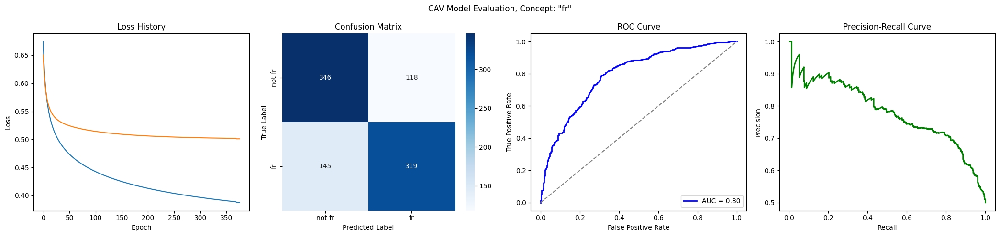

In [ ]:
cav_vector, evaluation_metric = train_one_cav(
    train_index=0,
    df=df,
    project_name=project_name,
    encoder_id=encoder_id,
    target_positive_class=target_positive_class,
    training_sample_count=training_sample_count,
    validation_sample_count=validation_sample_count,
    epochs=epochs,
    batch_size=batch_size,
    learning_rate=learning_rate,
    embedding_dim=embedding_dim,
    dropout_rate=dropout_rate,
    test_dataloader=test_dataloader,
)


store_cav_vector_array(cav_vector, f"cav_full_{project_name}.npy", project_name)
store_evaluation_metrics(
    evaluation_metric, f"evaluation_metrics_full_{project_name}.json", project_name
)
